In [89]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Load CSV data into pandas DataFrame
crime_df = pd.read_csv(r"C:\Users\User\Downloads\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv")

# Check the columns
print(crime_df.columns)

# Convert to GeoDataFrame using LAT_WGS84 and LONG_WGS84
geometry = [Point(xy) for xy in zip(crime_df['LONG_WGS84'], crime_df['LAT_WGS84'])]
crime_gdf = gpd.GeoDataFrame(crime_df, geometry=geometry, crs="EPSG:4326")
shapefile_path = r"C:\Users\User\Downloads\Neighbourhood_Crime_Rates_Open_Data_-7850543563477888236\NEIGHBOURHOOD_CRIME_RATE_OPEN_DATA.shp"
neighborhood_gdf = gpd.read_file(shapefile_path)



Index(['OBJECTID', 'EVENT_UNIQUE_ID', 'REPORT_DATE', 'OCC_DATE', 'REPORT_YEAR',
       'REPORT_MONTH', 'REPORT_DAY', 'REPORT_DOY', 'REPORT_DOW', 'REPORT_HOUR',
       'OCC_YEAR', 'OCC_MONTH', 'OCC_DAY', 'OCC_DOY', 'OCC_DOW', 'OCC_HOUR',
       'DIVISION', 'LOCATION_TYPE', 'PREMISES_TYPE', 'UCR_CODE', 'UCR_EXT',
       'OFFENCE', 'MCI_CATEGORY', 'HOOD_158', 'NEIGHBOURHOOD_158', 'HOOD_140',
       'NEIGHBOURHOOD_140', 'LONG_WGS84', 'LAT_WGS84', 'x', 'y'],
      dtype='object')


In [4]:
# Reproject crime_gdf to match neighborhood CRS
crime_gdf = crime_gdf.to_crs(neighborhood_gdf.crs)

# Verify CRS
print("Updated Crime Data CRS:", crime_gdf.crs)
print("Neighborhood CRS:", neighborhood_gdf.crs)


Updated Crime Data CRS: EPSG:26917
Neighborhood CRS: EPSG:26917


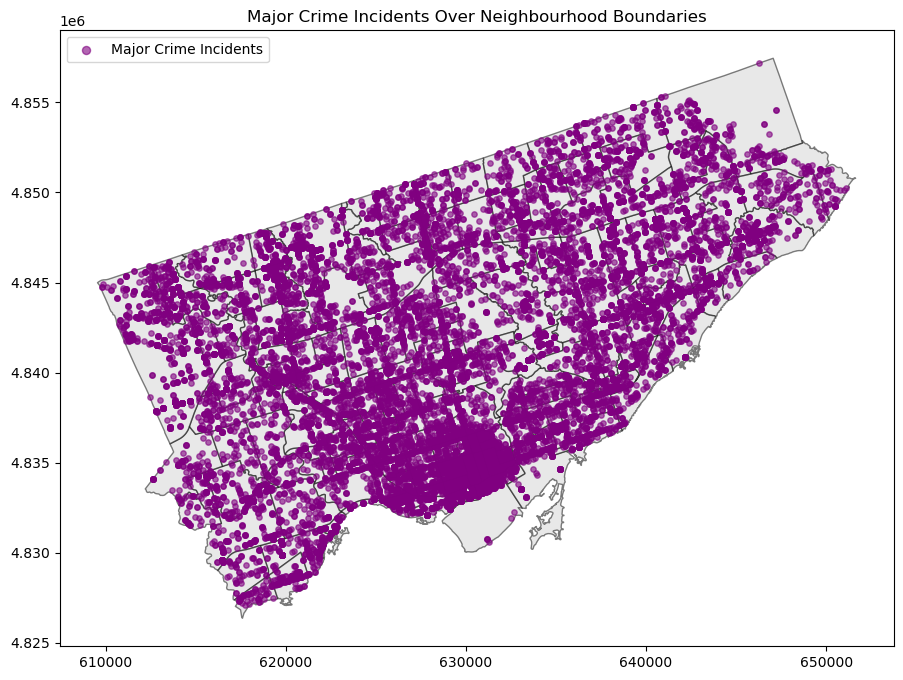

In [8]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot neighborhood boundaries
neighborhood_gdf.plot(ax=ax, color='lightgrey', edgecolor='black', alpha=0.5)

# Plot crime incidents
crime_gdf.plot(
    ax=ax, 
    color='purple', 
    markersize=15, 
    alpha=0.6, 
    label="Major Crime Incidents"
)

# Add title and legend
plt.title("Major Crime Incidents Over Neighbourhood Boundaries")
plt.legend(loc="upper left", markerscale=1.5)
plt.show()


In [86]:
print(crime_gdf.dtypes)


OBJECTID                int64
EVENT_UNIQUE_ID        object
REPORT_DATE            object
OCC_DATE               object
REPORT_YEAR             int64
REPORT_MONTH           object
REPORT_DAY              int64
REPORT_DOY              int64
REPORT_DOW             object
REPORT_HOUR             int64
OCC_YEAR              float64
OCC_MONTH              object
OCC_DAY               float64
OCC_DOY               float64
OCC_DOW                object
OCC_HOUR                int64
DIVISION               object
LOCATION_TYPE          object
PREMISES_TYPE          object
UCR_CODE                int64
UCR_EXT                 int64
OFFENCE                object
MCI_CATEGORY           object
HOOD_158               object
NEIGHBOURHOOD_158      object
HOOD_140               object
NEIGHBOURHOOD_140      object
LONG_WGS84            float64
LAT_WGS84             float64
x                     float64
y                     float64
geometry             geometry
dtype: object


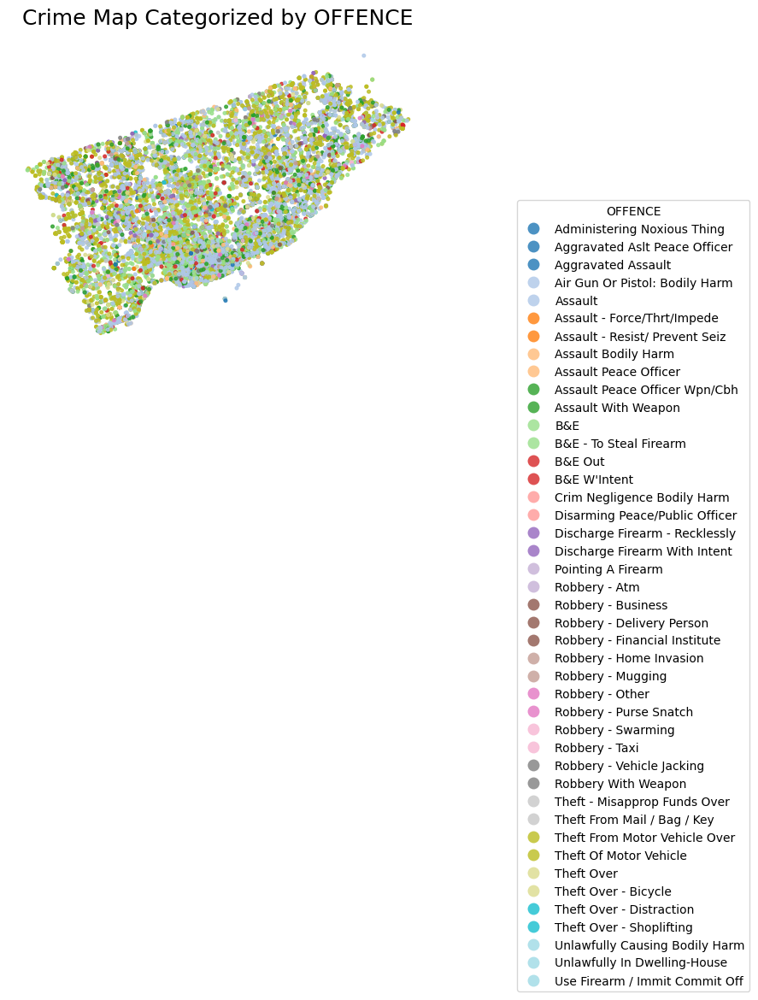

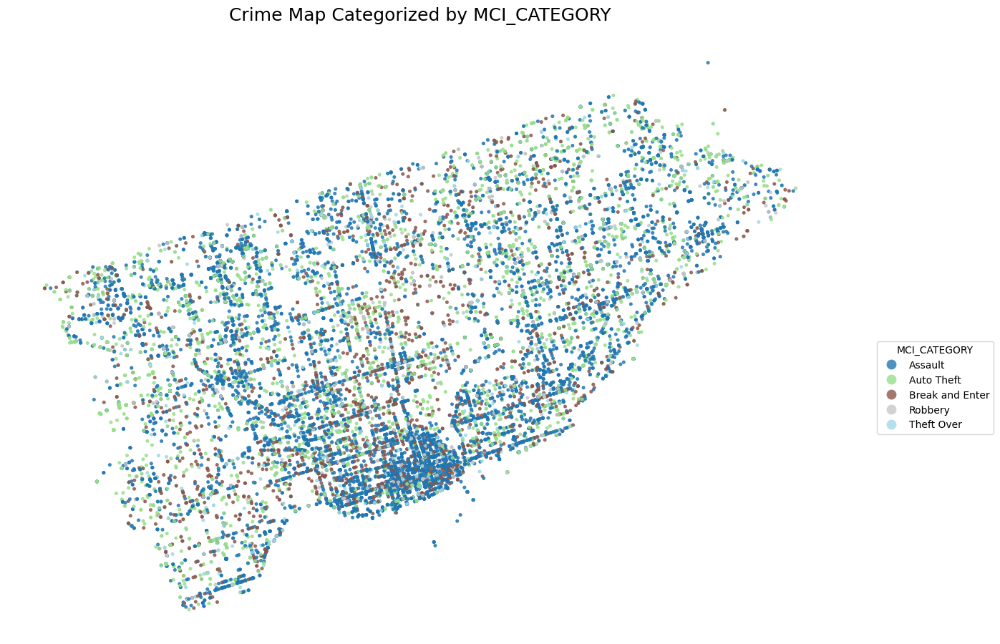

In [7]:
import matplotlib.pyplot as plt

# Function to plot map based on a column
def plot_crime_map(geo_df, column, title, cmap="tab20"):
    fig, ax = plt.subplots(figsize=(14, 10))  # Increase figure size
    
    # Plot the GeoDataFrame
    geo_df.plot(column=column, legend=True, cmap=cmap, markersize=7, alpha=0.8, ax=ax)
    
    # Adjust legend position outside the plot
    legend = ax.get_legend()
    if legend:
        legend.set_bbox_to_anchor((1.2, 0.5))  # Move legend further to the right
        legend.set_title(column)  # Set legend title
    
    plt.title(title, fontsize=18, pad=15)  # Add title with more padding
    plt.axis('off')  # Remove axes
    plt.tight_layout(pad=2)  # Adjust layout to ensure everything fits
    plt.show()

# Map 1: Plot based on 'OFFENCE'
plot_crime_map(crime_gdf, column='OFFENCE', title='Crime Map Categorized by OFFENCE')

# Map 2: Plot based on 'MCI_CATEGORY'
plot_crime_map(crime_gdf, column='MCI_CATEGORY', title='Crime Map Categorized by MCI_CATEGORY')


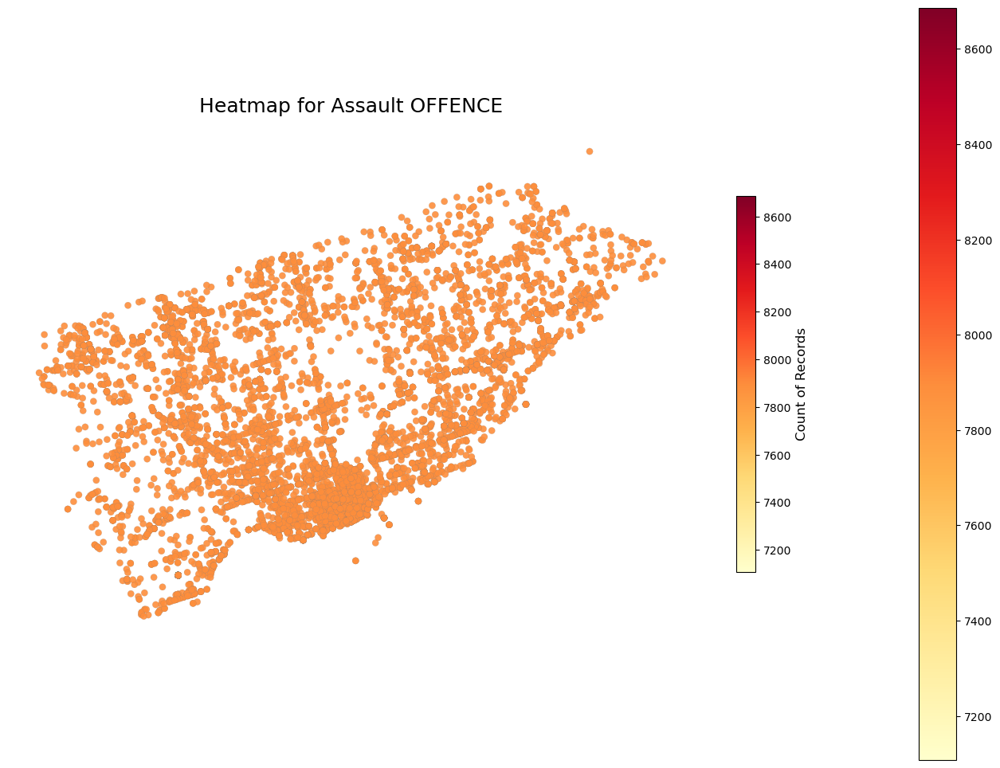

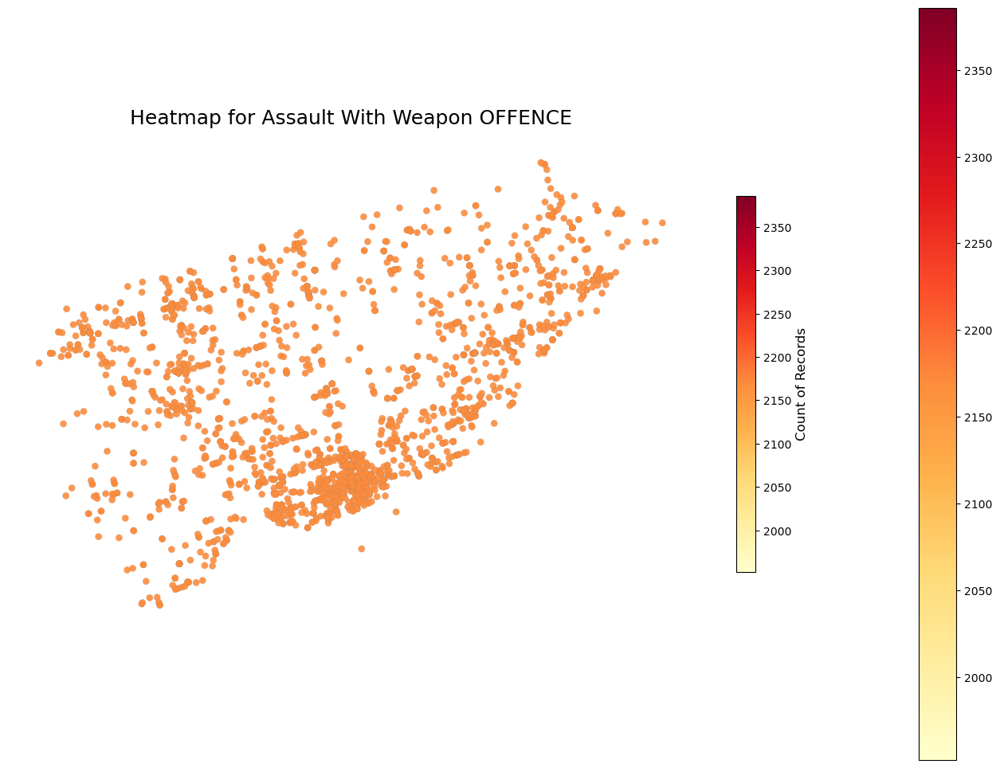

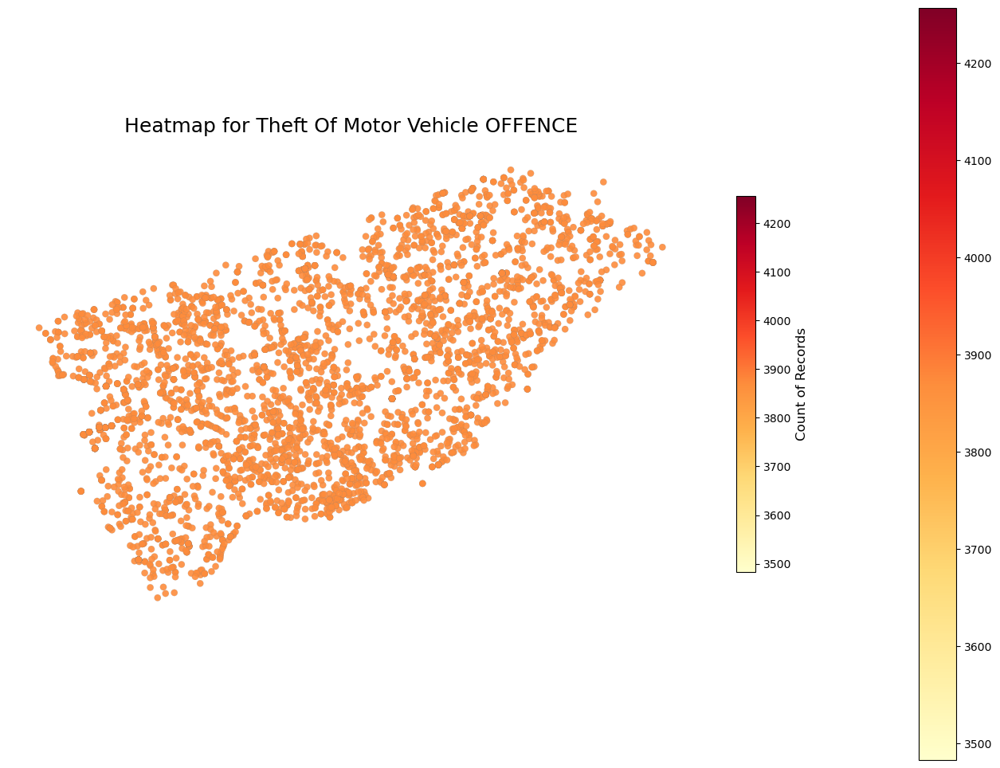

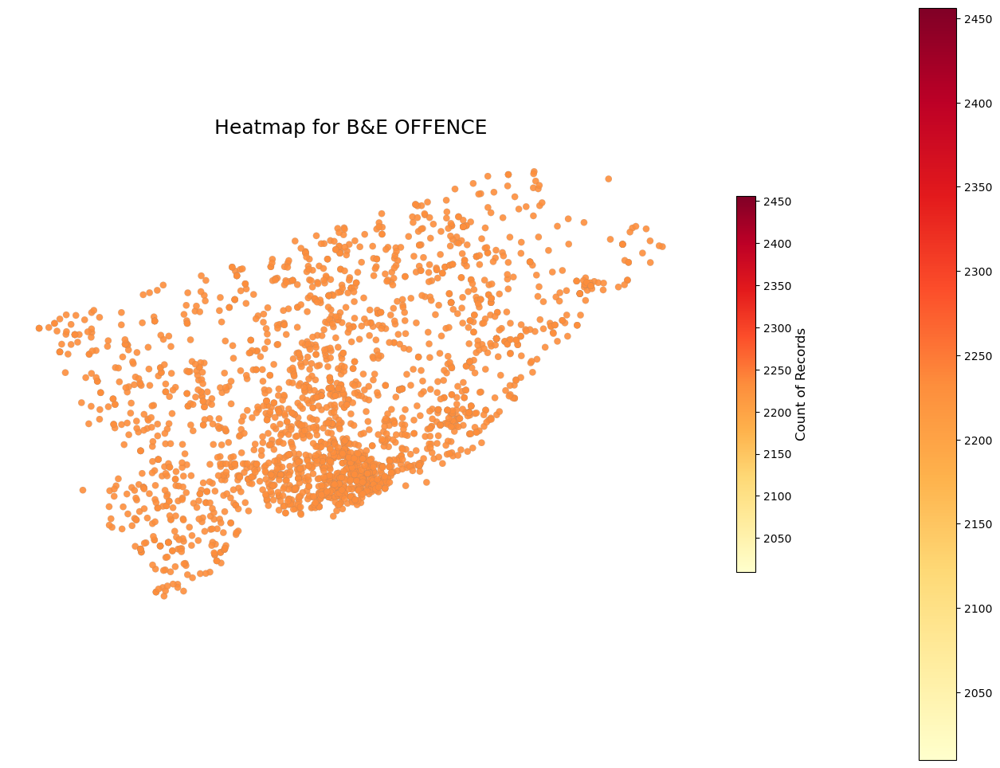

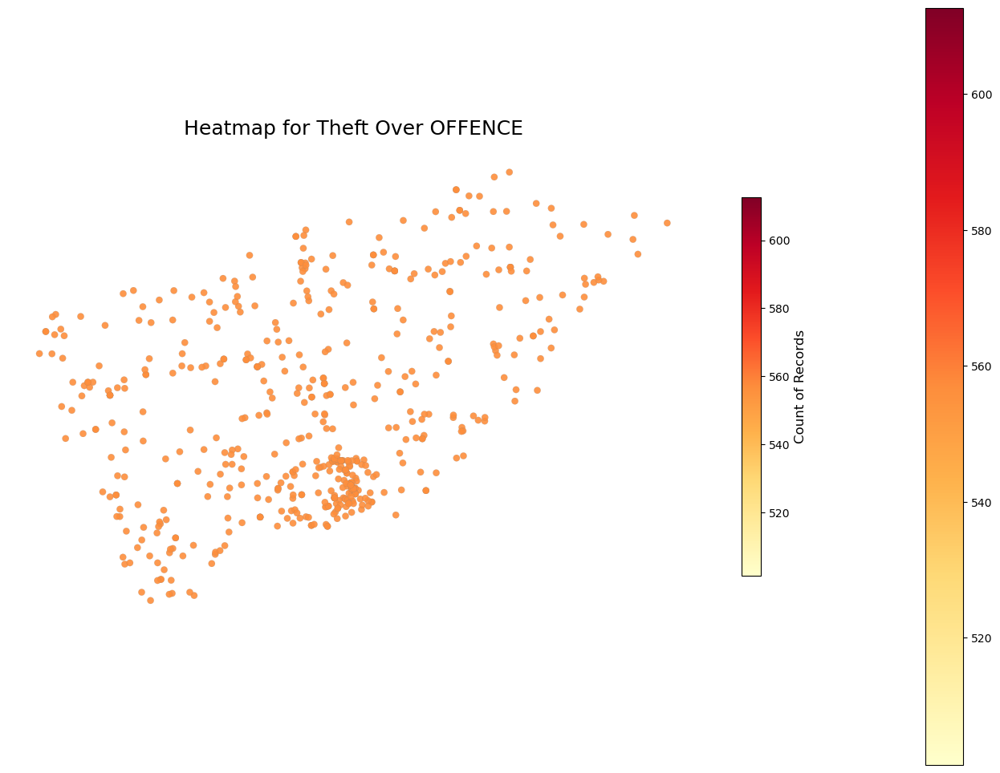

...

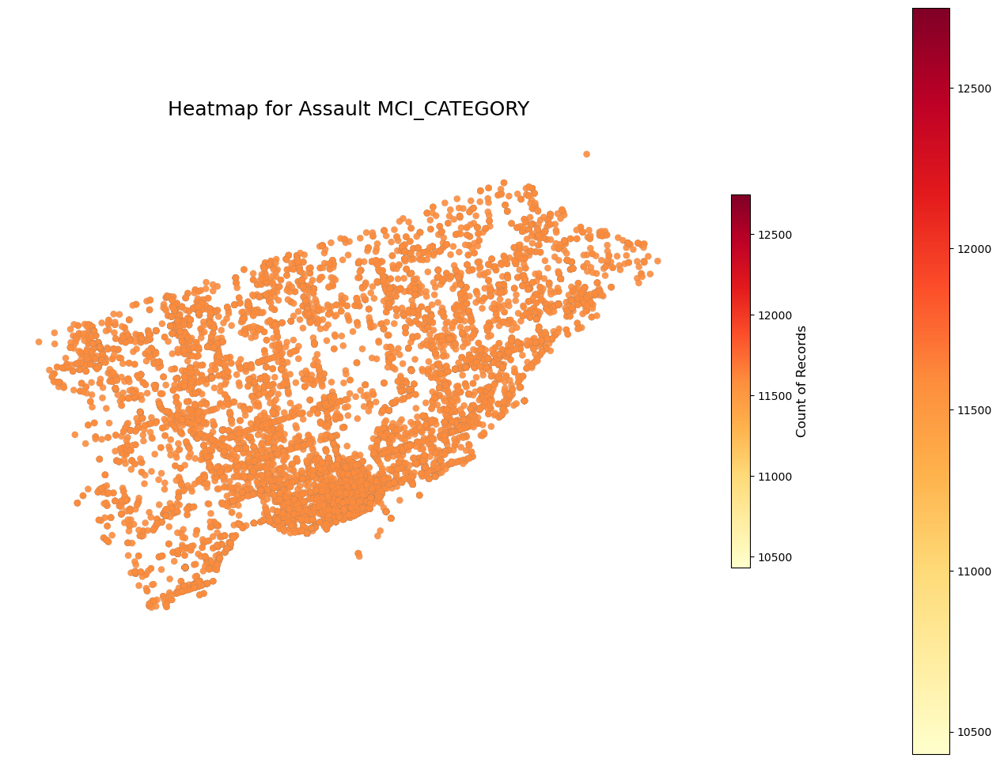

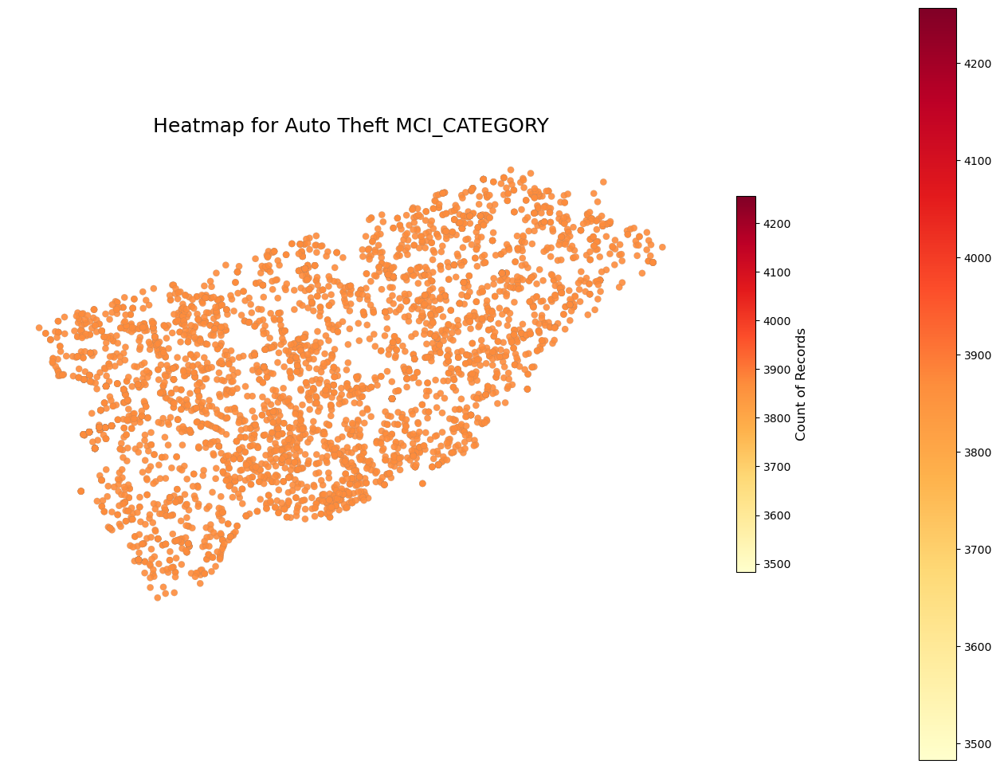

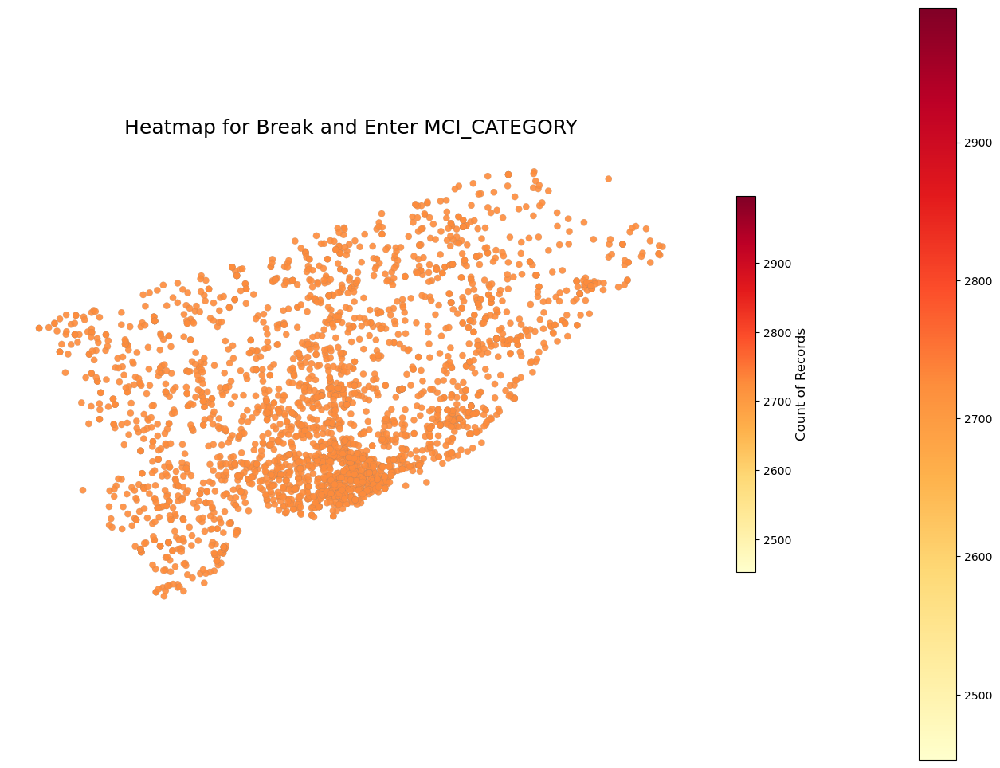

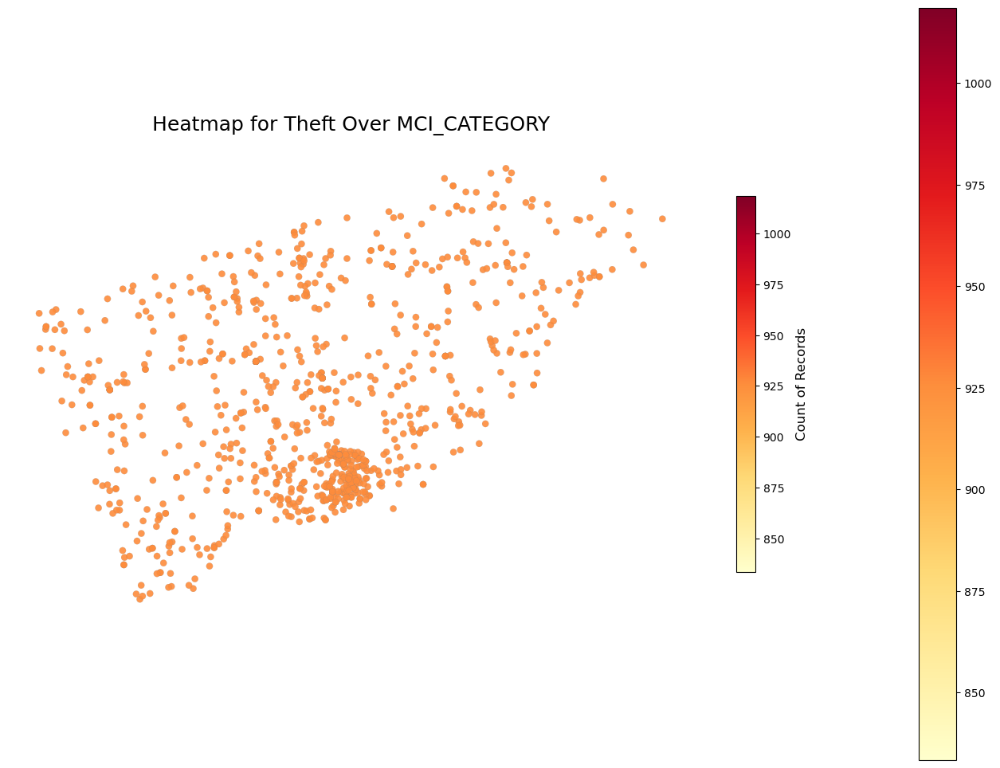

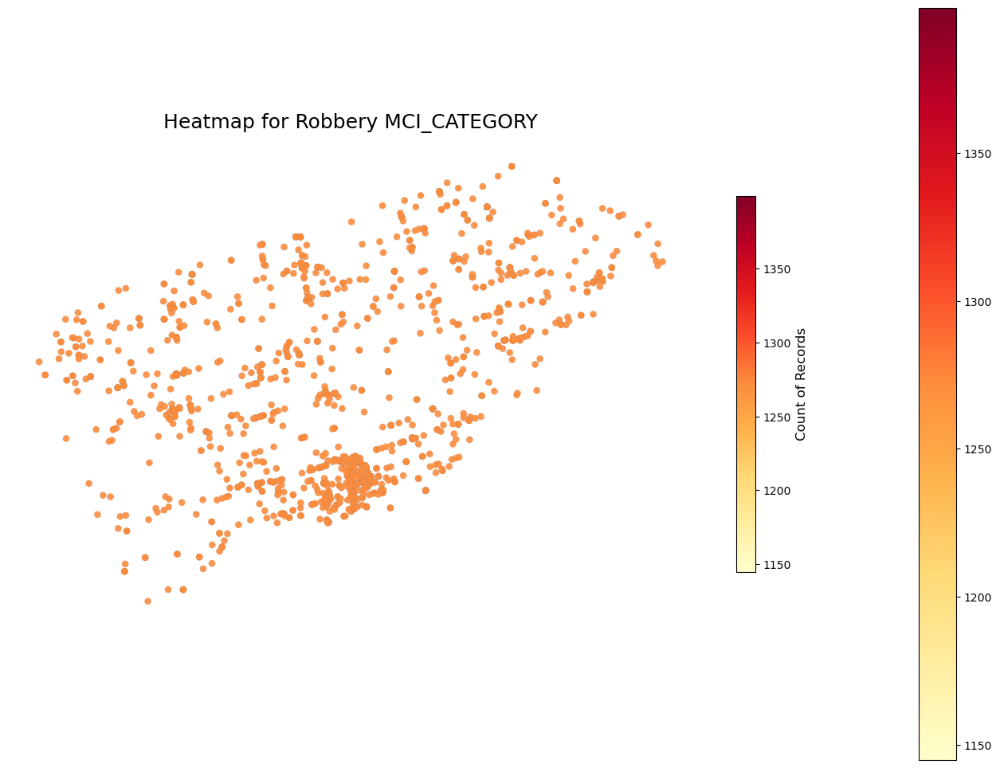

In [88]:
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
from matplotlib.colors import Normalize
from matplotlib import cm

# Function to plot heatmap based on a column
def plot_heatmap(geo_df, column, title, cmap="YlOrRd"):
    fig, ax = plt.subplots(figsize=(14, 10))  # Increase figure size

    # Group and count occurrences of the specified column
    category_counts = geo_df.groupby(column).size().reset_index(name='counts')

    # Normalize counts for color scaling
    vmin = category_counts['counts'].min()
    vmax = category_counts['counts'].max()
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    # Merge counts back into GeoDataFrame
    geo_df = geo_df.merge(category_counts, on=column, how='left')

    # Plot heatmap with normalized color scale
    geo_df.plot(column='counts', legend=True, cmap=cmap, alpha=0.9, 
                norm=norm, edgecolor="grey", linewidth=0.1, ax=ax)
    
    # Add colorbar manually for better formatting
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []  # Dummy array for ScalarMappable
    cbar = fig.colorbar(sm, ax=ax, shrink=0.5)
    cbar.set_label('Count of Records', fontsize=12)
    
    plt.title(title, fontsize=18, pad=15)
    plt.axis('off')  # Remove axes
    plt.tight_layout(pad=2)  # Adjust layout to ensure everything fits
    plt.show()

# Function to generate heatmaps for each OFFENCE type
def generate_heatmaps_by_offence(geo_df):
    for offence in geo_df['OFFENCE'].unique():
        offence_df = geo_df[geo_df['OFFENCE'] == offence]
        plot_heatmap(offence_df, column='OFFENCE', title=f"Heatmap for {offence} OFFENCE")

# Function to generate heatmaps for each MCI_CATEGORY type
def generate_heatmaps_by_mci(geo_df):
    for mci_category in geo_df['MCI_CATEGORY'].unique():
        mci_df = geo_df[geo_df['MCI_CATEGORY'] == mci_category]
        plot_heatmap(mci_df, column='MCI_CATEGORY', title=f"Heatmap for {mci_category} MCI_CATEGORY")

# Generate improved heatmaps for 'OFFENCE' categories
generate_heatmaps_by_offence(crime_gdf)

# Generate improved heatmaps for 'MCI_CATEGORY' categories
generate_heatmaps_by_mci(crime_gdf)


In [54]:
crime_df

,OBJECTID,EVENT_UNIQUE_ID,REPORT_DATE,OCC_DATE,REPORT_YEAR,REPORT_MONTH,REPORT_DAY,REPORT_DOY,REPORT_DOW,REPORT_HOUR,...,OFFENCE,MCI_CATEGORY,HOOD_158,NEIGHBOURHOOD_158,HOOD_140,NEIGHBOURHOOD_140,LONG_WGS84,LAT_WGS84,x,y
0,388377,GO-2024916759,4/29/2024 5:00:00 AM,4/29/2024 5:00:00 AM,2024,April,29,120,Monday,14,...,Assault,Assault,098,Rosedale-Moore Park (98),098,Rosedale-Moore Park (98),-79.389519,43.676950,-8.837601e+06,5.415585e+06
1,388378,GO-2024916273,4/29/2024 5:00:00 AM,9/8/2022 5:00:00 AM,2024,April,29,120,Monday,13,...,Assault,Assault,167,Church-Wellesley (167),075,Church-Yonge Corridor (75),-79.382026,43.668347,-8.836767e+06,5.414261e+06
2,388379,GO-2024916104,4/29/2024 5:00:00 AM,4/28/2024 5:00:00 AM,2024,April,29,120,Monday,13,...,Assault,Assault,031,Yorkdale-Glen Park (31),031,Yorkdale-Glen Park (31),-79.465586,43.707420,-8.846069e+06,5.420276e+06
3,388380,GO-2024917089,4/29/2024 5:00:00 AM,4/29/2024 5:00:00 AM,2024,April,29,120,Monday,15,...,Assault With Weapon,Assault,023,Pelmo Park-Humberlea (23),023,Pelmo Park-Humberlea (23),-79.534526,43.709707,-8.853743e+06,5.420628e+06
4,388381,GO-2024914235,4/29/2024 5:00:00 AM,4/23/2024 5:00:00 AM,2024,April,29,120,Monday,9,...,Assault,Assault,091,Weston-Pelham Park (91),091,Weston-Pelham Park (91),-79.455765,43.670323,-8.844975e+06,5.414565e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20377,408754,GO-20242133371,9/29/2024 5:00:00 AM,9/29/2024 5:00:00 AM,2024,September,29,273,Sunday,7,...,Assault With Weapon,Assault,073,Moss Park (73),073,Moss Park (73),-79.370099,43.656163,-8.835439e+06,5.412386e+06
20378,408755,GO-20242133128,9/29/2024 5:00:00 AM,9/29/2024 5:00:00 AM,2024,September,29,273,Sunday,6,...,Assault,Assault,165,Harbourfront-CityPlace (165),077,Waterfront Communities-The Island (77),-79.399641,43.636482,-8.838728e+06,5.409358e+06
20379,408756,GO-20242129204,9/29/2024 5:00:00 AM,9/28/2024 5:00:00 AM,2024,September,29,273,Sunday,9,...,Assault,Assault,111,Rockcliffe-Smythe (111),111,Rockcliffe-Smythe (111),-79.493749,43.671670,-8.849204e+06,5.414772e+06
20380,408757,GO-20242138138,9/29/2024 5:00:00 AM,9/29/2024 5:00:00 AM,2024,September,29,273,Sunday,20,...,Assault With Weapon,Assault,085,South Parkdale (85),085,South Parkdale (85),-79.439492,43.639104,-8.843164e+06,5.409762e+06


In [89]:
# Ensure crime_gdf matches the CRS of boundary_gdf
crime_gdf = crime_gdf.to_crs(boundary_gdf.crs)

# Confirm CRS alignment
print("Crime CRS:", crime_gdf.crs)
print("Boundary CRS:", boundary_gdf.crs)


Crime CRS: EPSG:4326
Boundary CRS: EPSG:4326


In [90]:
print("Crime GDF Columns:", crime_gdf.columns)
print("Boundary GDF Columns:", boundary_gdf.columns)


Crime GDF Columns: Index(['OBJECTID', 'EVENT_UNIQUE_ID', 'REPORT_DATE', 'OCC_DATE', 'REPORT_YEAR',
       'REPORT_MONTH', 'REPORT_DAY', 'REPORT_DOY', 'REPORT_DOW', 'REPORT_HOUR',
       'OCC_YEAR', 'OCC_MONTH', 'OCC_DAY', 'OCC_DOY', 'OCC_DOW', 'OCC_HOUR',
       'DIVISION', 'LOCATION_TYPE', 'PREMISES_TYPE', 'UCR_CODE', 'UCR_EXT',
       'OFFENCE', 'MCI_CATEGORY', 'HOOD_158', 'NEIGHBOURHOOD_158', 'HOOD_140',
       'NEIGHBOURHOOD_140', 'LONG_WGS84', 'LAT_WGS84', 'x', 'y', 'geometry'],
      dtype='object')
Boundary GDF Columns: Index(['AREA_NAME', 'HOOD_ID', 'ASSAULT_20', 'ASSAULT_21', 'ASSAULT_22',
       'ASSAULT_23', 'ASSAULT_24', 'ASSAULT_25', 'ASSAULT_26', 'ASSAULT_27',
       ...
       'THEFTOV_11', 'THEFTOV_12', 'THEFTOV_13', 'THEFTOV_14', 'THEFTOV_15',
       'THEFTOV_16', 'THEFTOV_17', 'THEFTOV_18', 'POPULATION', 'geometry'],
      dtype='object', length=184)


In [91]:
# Group by 'HOOD_158' and count occurrences
crime_counts = crime_gdf.groupby('HOOD_158').size().reset_index(name='counts')


In [10]:
neighborhood_gdf

,AREA_NAME,HOOD_ID,ASSAULT_20,ASSAULT_21,ASSAULT_22,ASSAULT_23,ASSAULT_24,ASSAULT_25,ASSAULT_26,ASSAULT_27,...,THEFTOV_11,THEFTOV_12,THEFTOV_13,THEFTOV_14,THEFTOV_15,THEFTOV_16,THEFTOV_17,THEFTOV_18,POPULATION,geometry
0,South Eglinton-Davisville,174.0,63,61,70,82,85,70,82,121,...,21.590111,5.237247,15.232292,14.822866,24.197842,28.634151,14.006910,36.385136,21987,"POLYGON ((630028.471 4839577.662, 630038.998 4..."
1,North Toronto,173.0,45,52,43,52,55,77,72,104,...,17.305529,16.500288,39.413528,30.234316,43.830814,14.241971,27.502750,46.428333,15077,"POLYGON ((629115.644 4840570.87, 629041.152 48..."
2,Dovercourt Village,172.0,56,57,79,94,94,96,75,101,...,37.180248,22.146759,29.146021,21.698250,21.709240,14.541224,29.008631,21.681000,13837,"POLYGON ((626258.755 4835318.329, 626158.296 4..."
3,Junction-Wallace Emerson,171.0,154,157,166,157,157,182,169,178,...,24.753496,24.404133,27.956388,15.754854,35.254025,31.309929,31.035419,34.298782,26240,"POLYGON ((625873.202 4836146.058, 625898.184 4..."
4,Yonge-Bay Corridor,170.0,394,524,487,603,576,660,383,323,...,233.301651,289.951111,349.539246,481.909271,259.798096,188.651871,358.826416,346.208679,14731,"POLYGON ((630329.084 4833709.787, 630250.328 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,West Humber-Clairville,1.0,288,306,293,302,318,257,250,243,...,120.662766,168.330627,145.531326,183.010956,156.792481,154.100479,169.524490,219.852692,36388,"POLYGON ((613519.946 4843296.232, 613600.045 4..."
154,Black Creek,24.0,212,214,264,229,186,205,260,207,...,36.026299,75.804871,35.260929,39.318481,69.832405,39.480610,34.968090,56.406475,23047,"POLYGON ((619176.521 4847836.65, 619187.727 48..."
155,Pelmo Park-Humberlea,23.0,60,49,62,54,74,78,55,57,...,36.673695,53.947132,35.174110,60.480389,85.543198,17.027073,75.636604,49.500866,12121,"POLYGON ((618198.466 4843492.609, 618452.119 4..."
156,Humbermede,22.0,117,135,114,158,120,168,95,134,...,6.241418,43.260612,61.064972,48.437878,72.538231,78.950562,54.433289,66.393044,16568,"POLYGON ((618512.46 4844520.713, 618594.26 484..."


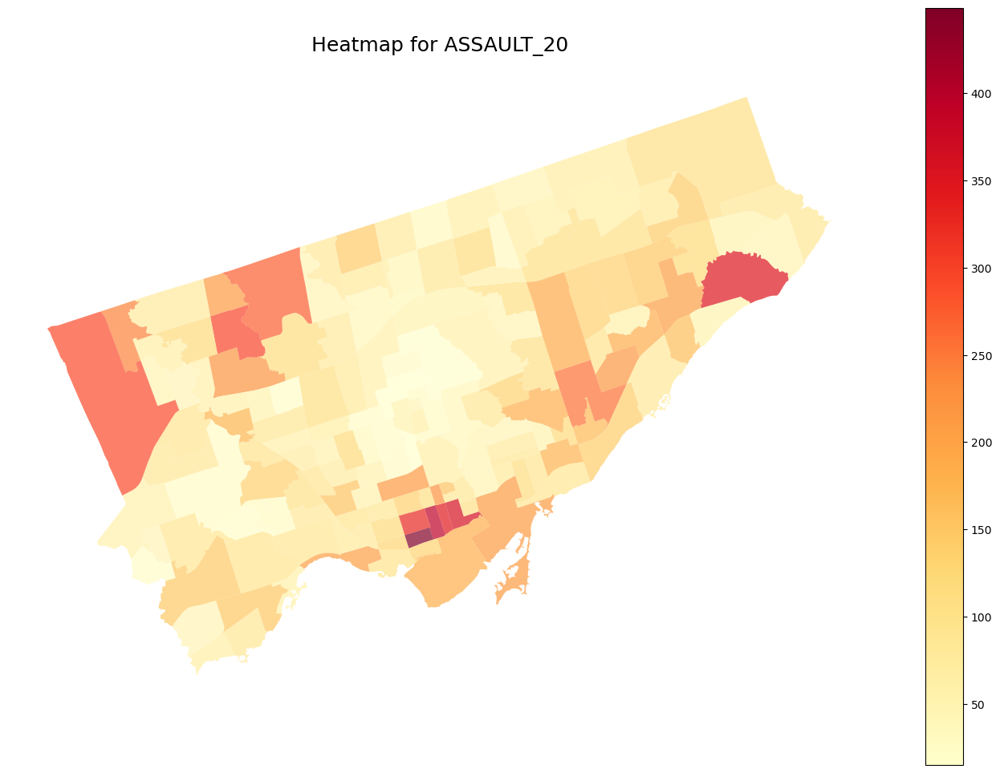

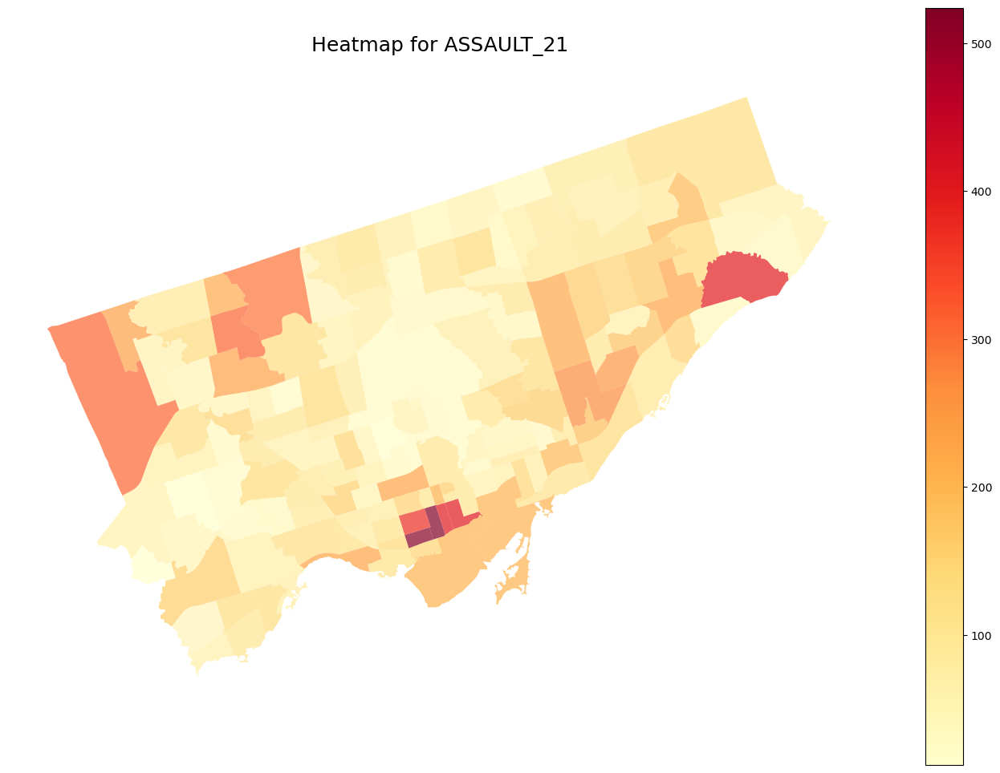

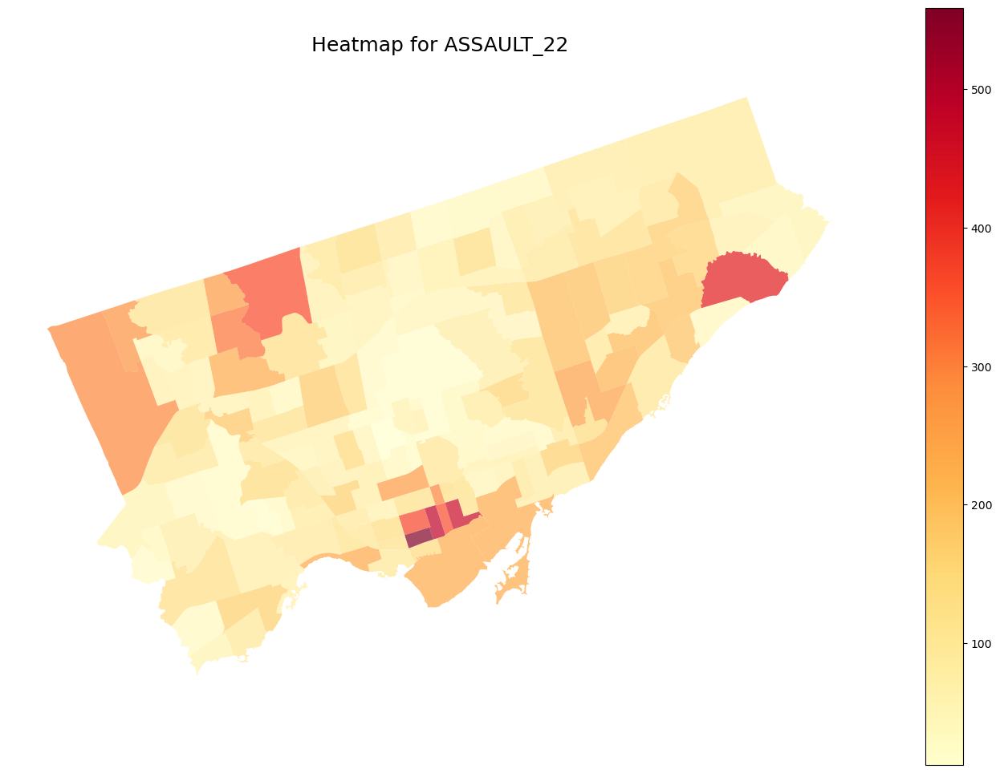

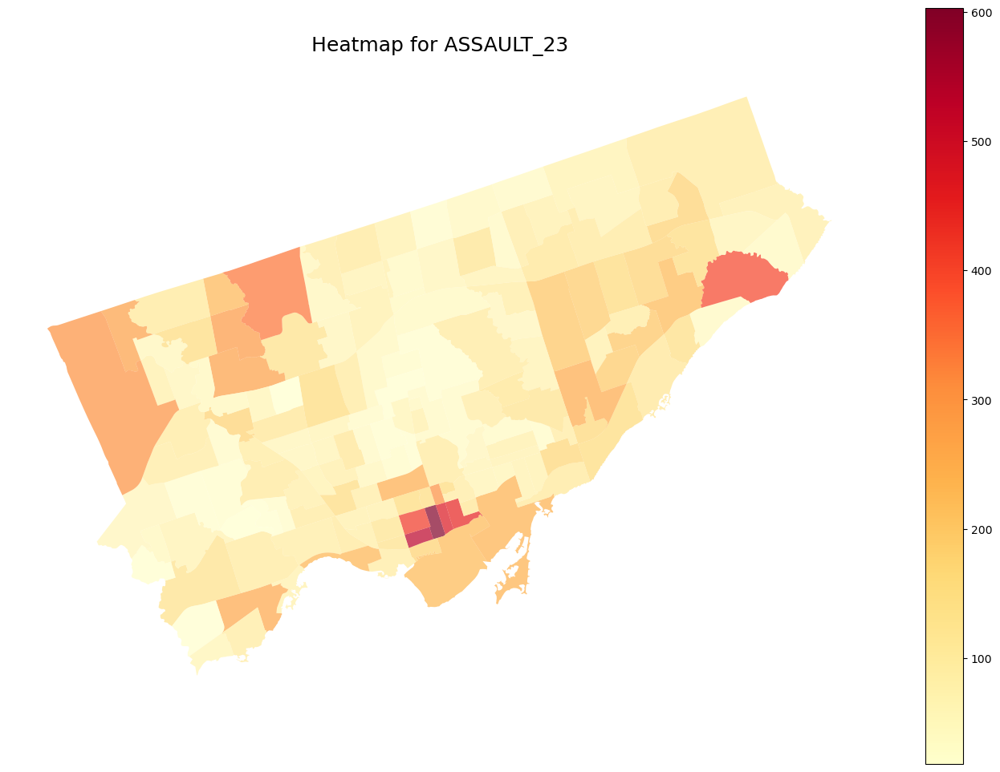

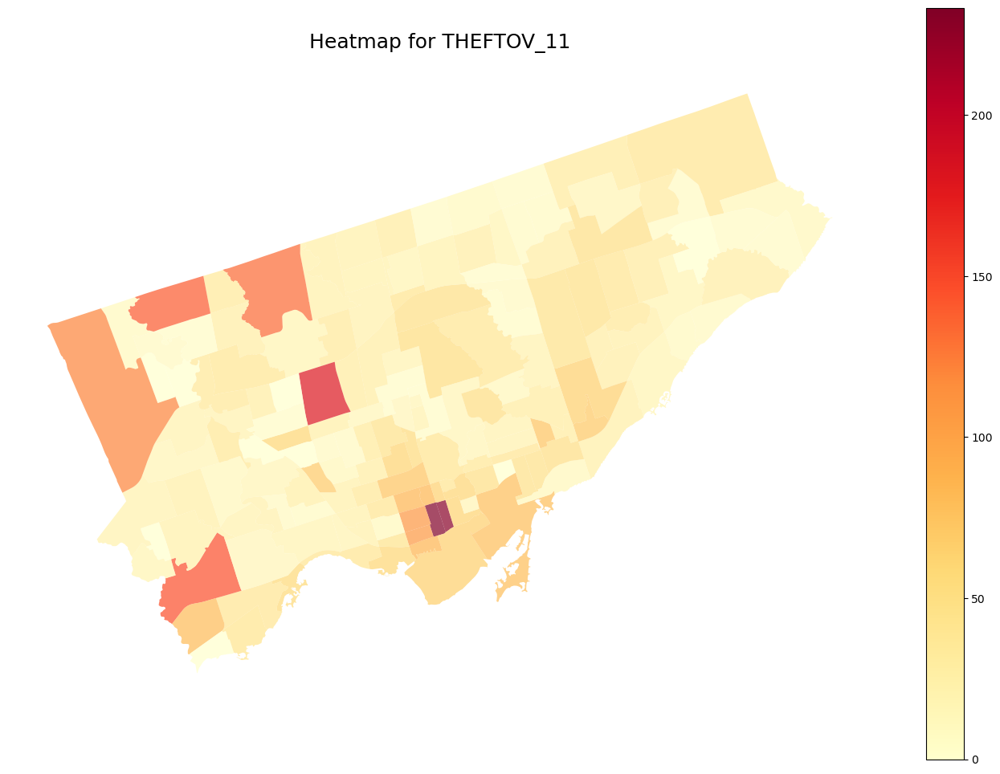

...

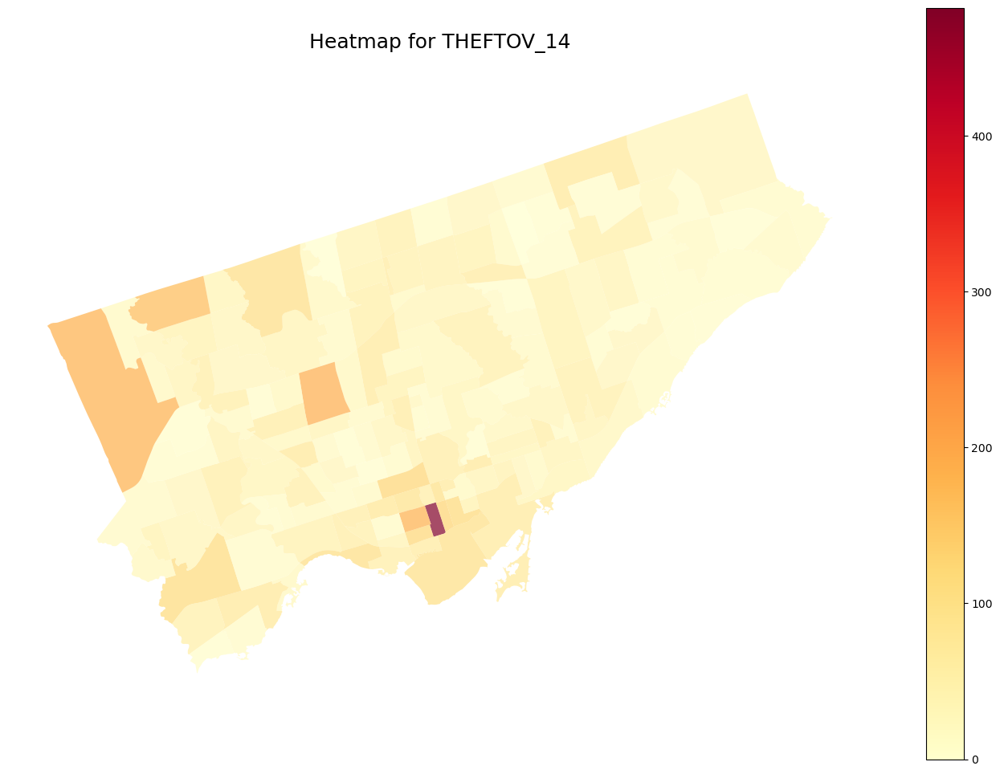

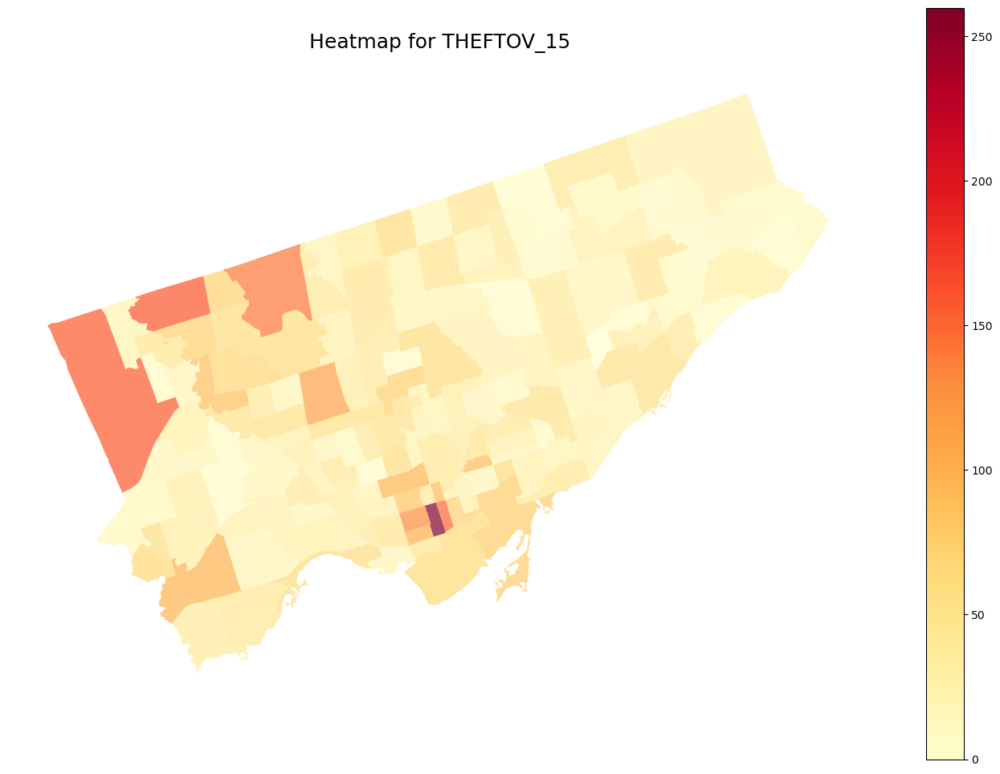

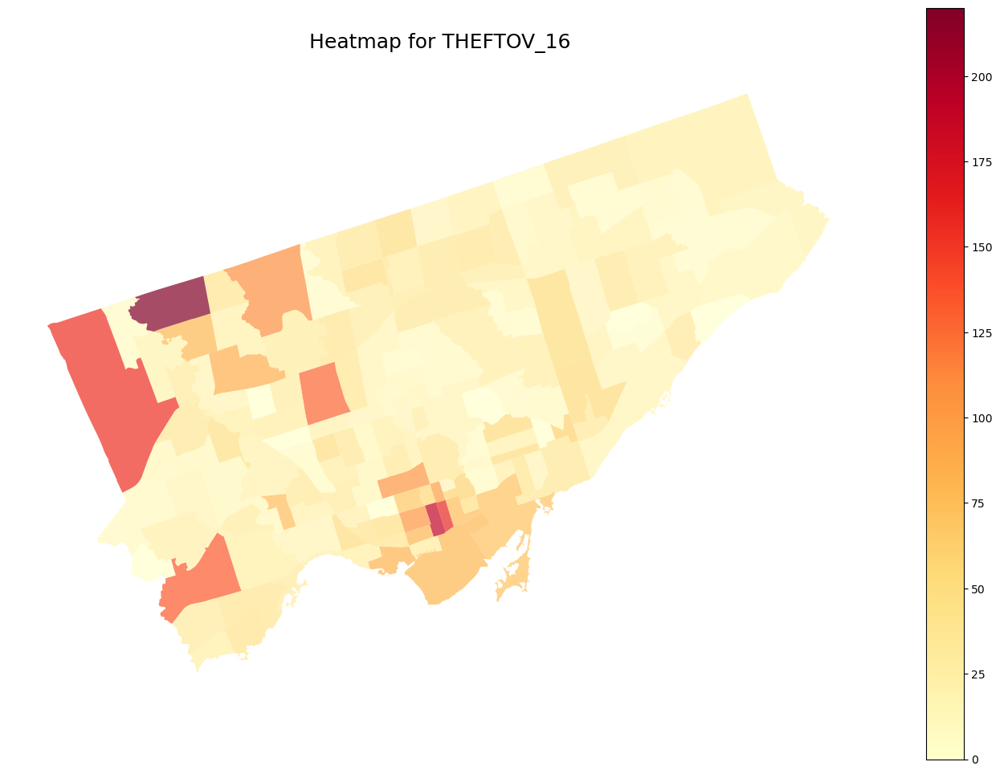

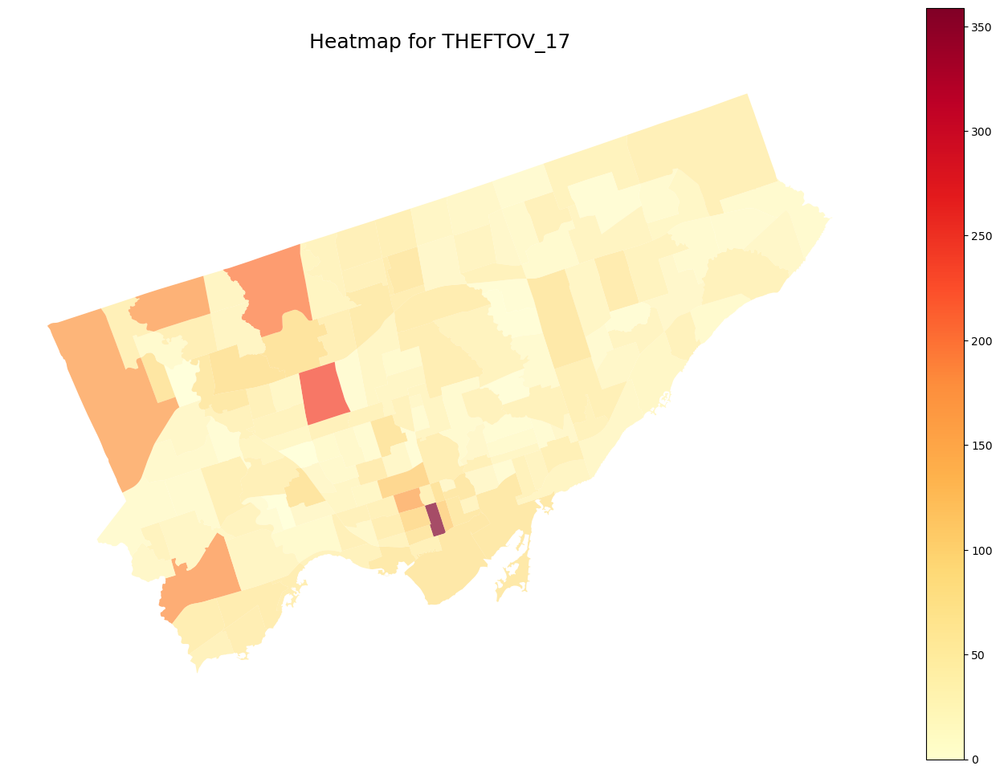

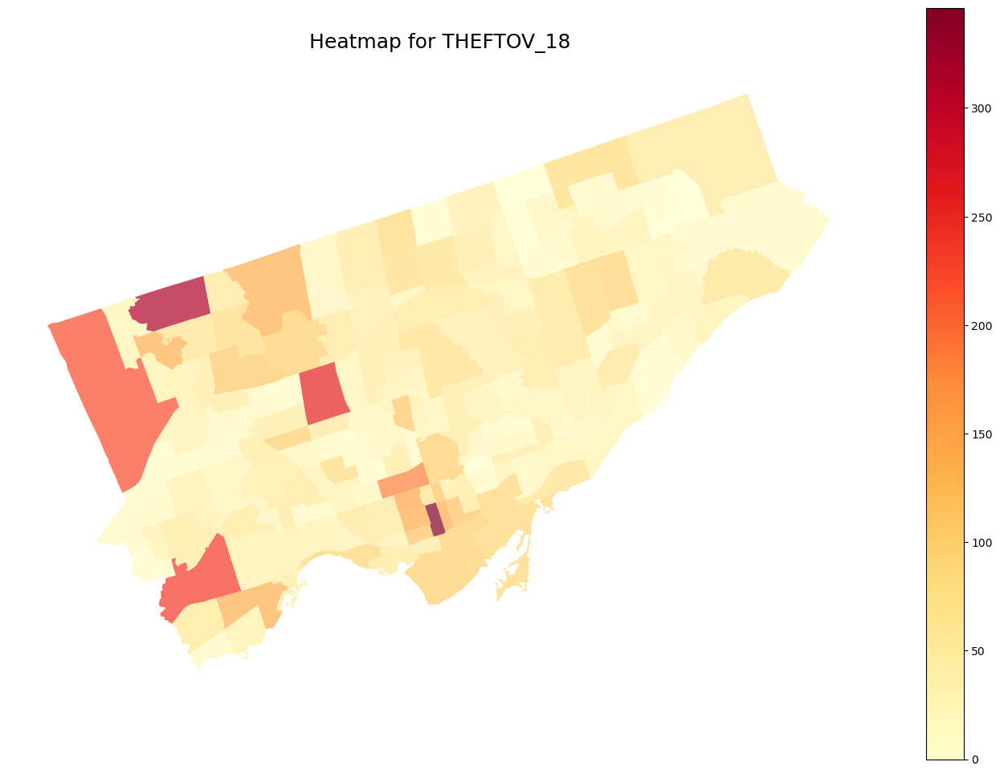

In [12]:
import matplotlib.pyplot as plt

# Function to plot heatmap for various crime data
def plot_crime_heatmap(geo_df, column, title, cmap="YlOrRd"):
    fig, ax = plt.subplots(figsize=(14, 10))  # Increase figure size
    
    # Plot the GeoDataFrame with the crime data for the specific year/column
    geo_df.plot(column=column, legend=True, cmap=cmap, alpha=0.7, ax=ax)
    
    # Adjust legend position outside the plot
    legend = ax.get_legend()
    if legend:
        legend.set_bbox_to_anchor((1.2, 0.5))  # Move legend further to the right
        legend.set_title(column)  # Set legend title
    
    plt.title(title, fontsize=18, pad=15)  # Add title with more padding
    plt.axis('off')  # Remove axes
    plt.tight_layout(pad=2)  # Adjust layout to ensure everything fits
    plt.show()

# List of crime-related columns for assault and theft data (update according to the correct format)
crime_columns = [
    'ASSAULT_20', 'ASSAULT_21', 'ASSAULT_22', 'ASSAULT_23',
    'THEFTOV_11', 'THEFTOV_12', 'THEFTOV_13', 'THEFTOV_14', 
    'THEFTOV_15', 'THEFTOV_16', 'THEFTOV_17', 'THEFTOV_18'
]

# Generate heatmaps for each crime category
for column in crime_columns:
    plot_crime_heatmap(neighborhood_gdf, column=column, title=f"Heatmap for {column}")


In [72]:
# Print all column names of the boundary_gdf GeoDataFrame, one per line
for column in crime_gdf.columns:
    print(column)


OBJECTID
EVENT_UNIQUE_ID
REPORT_DATE
OCC_DATE
REPORT_YEAR
REPORT_MONTH
REPORT_DAY
REPORT_DOY
REPORT_DOW
REPORT_HOUR
OCC_YEAR
OCC_MONTH
OCC_DAY
OCC_DOY
OCC_DOW
OCC_HOUR
DIVISION
LOCATION_TYPE
PREMISES_TYPE
UCR_CODE
UCR_EXT
OFFENCE
MCI_CATEGORY
HOOD_158
NEIGHBOURHOOD_158
HOOD_140
NEIGHBOURHOOD_140
LONG_WGS84
LAT_WGS84
x
y
geometry


In [74]:
crime_df

,OBJECTID,EVENT_UNIQUE_ID,REPORT_DATE,OCC_DATE,REPORT_YEAR,REPORT_MONTH,REPORT_DAY,REPORT_DOY,REPORT_DOW,REPORT_HOUR,...,OFFENCE,MCI_CATEGORY,HOOD_158,NEIGHBOURHOOD_158,HOOD_140,NEIGHBOURHOOD_140,LONG_WGS84,LAT_WGS84,x,y
0,388377,GO-2024916759,4/29/2024 5:00:00 AM,4/29/2024 5:00:00 AM,2024,April,29,120,Monday,14,...,Assault,Assault,098,Rosedale-Moore Park (98),098,Rosedale-Moore Park (98),-79.389519,43.676950,-8.837601e+06,5.415585e+06
1,388378,GO-2024916273,4/29/2024 5:00:00 AM,9/8/2022 5:00:00 AM,2024,April,29,120,Monday,13,...,Assault,Assault,167,Church-Wellesley (167),075,Church-Yonge Corridor (75),-79.382026,43.668347,-8.836767e+06,5.414261e+06
2,388379,GO-2024916104,4/29/2024 5:00:00 AM,4/28/2024 5:00:00 AM,2024,April,29,120,Monday,13,...,Assault,Assault,031,Yorkdale-Glen Park (31),031,Yorkdale-Glen Park (31),-79.465586,43.707420,-8.846069e+06,5.420276e+06
3,388380,GO-2024917089,4/29/2024 5:00:00 AM,4/29/2024 5:00:00 AM,2024,April,29,120,Monday,15,...,Assault With Weapon,Assault,023,Pelmo Park-Humberlea (23),023,Pelmo Park-Humberlea (23),-79.534526,43.709707,-8.853743e+06,5.420628e+06
4,388381,GO-2024914235,4/29/2024 5:00:00 AM,4/23/2024 5:00:00 AM,2024,April,29,120,Monday,9,...,Assault,Assault,091,Weston-Pelham Park (91),091,Weston-Pelham Park (91),-79.455765,43.670323,-8.844975e+06,5.414565e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20377,408754,GO-20242133371,9/29/2024 5:00:00 AM,9/29/2024 5:00:00 AM,2024,September,29,273,Sunday,7,...,Assault With Weapon,Assault,073,Moss Park (73),073,Moss Park (73),-79.370099,43.656163,-8.835439e+06,5.412386e+06
20378,408755,GO-20242133128,9/29/2024 5:00:00 AM,9/29/2024 5:00:00 AM,2024,September,29,273,Sunday,6,...,Assault,Assault,165,Harbourfront-CityPlace (165),077,Waterfront Communities-The Island (77),-79.399641,43.636482,-8.838728e+06,5.409358e+06
20379,408756,GO-20242129204,9/29/2024 5:00:00 AM,9/28/2024 5:00:00 AM,2024,September,29,273,Sunday,9,...,Assault,Assault,111,Rockcliffe-Smythe (111),111,Rockcliffe-Smythe (111),-79.493749,43.671670,-8.849204e+06,5.414772e+06
20380,408757,GO-20242138138,9/29/2024 5:00:00 AM,9/29/2024 5:00:00 AM,2024,September,29,273,Sunday,20,...,Assault With Weapon,Assault,085,South Parkdale (85),085,South Parkdale (85),-79.439492,43.639104,-8.843164e+06,5.409762e+06


In [75]:
# Extract unique values from the 'MCI_CATEGORY' column
unique_mci_categories = crime_df['MCI_CATEGORY'].unique()

# Print the unique values
print(unique_mci_categories)


['Assault' 'Auto Theft' 'Break and Enter' 'Theft Over' 'Robbery']


Processing category: Assault

OLS Regression Summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.180e+07
Date:                Mon, 16 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:31:34   Log-Likelihood:                 11726.
No. Observations:               11589   AIC:                        -2.345e+04
Df Residuals:                   11587   BIC:                        -2.343e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

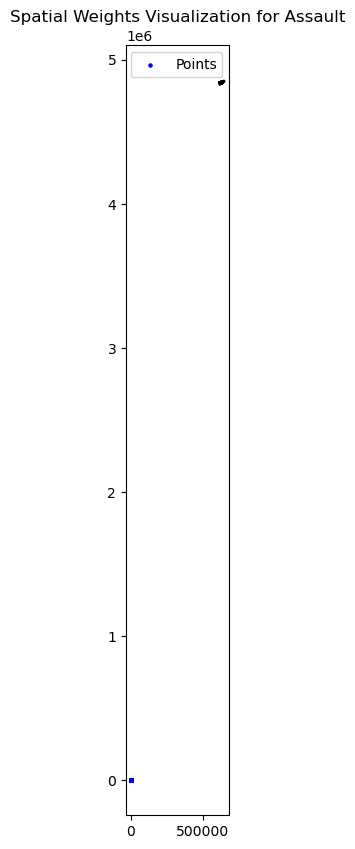

Processing category: Auto Theft

OLS Regression Summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 9.233e+06
Date:                Mon, 16 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:32:55   Log-Likelihood:                 3268.4
No. Observations:                3870   AIC:                            -6533.
Df Residuals:                    3868   BIC:                            -6520.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

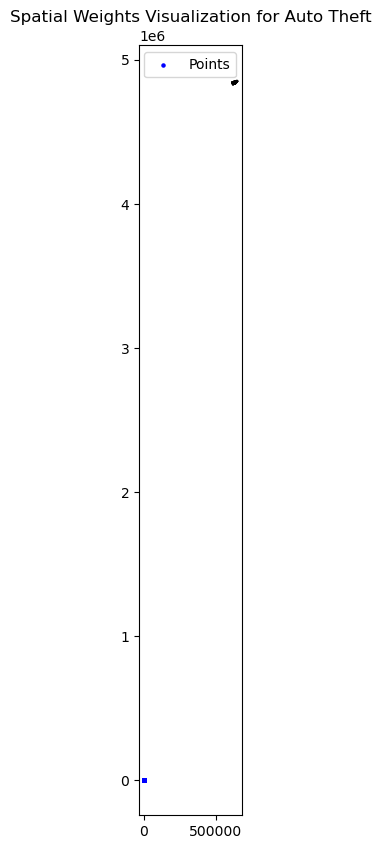

Processing category: Break and Enter

OLS Regression Summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 2.549e+06
Date:                Mon, 16 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:33:23   Log-Likelihood:                 2808.5
No. Observations:                2725   AIC:                            -5613.
Df Residuals:                    2723   BIC:                            -5601.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

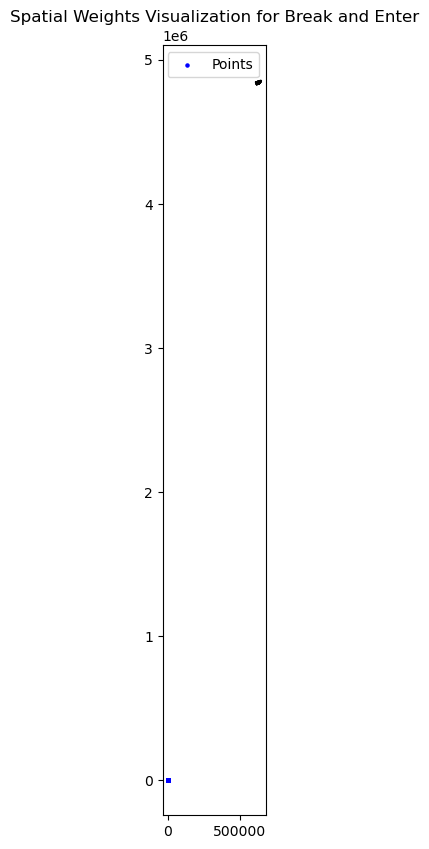

Processing category: Theft Over

OLS Regression Summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.317e+06
Date:                Mon, 16 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:33:41   Log-Likelihood:                 959.82
No. Observations:                 926   AIC:                            -1916.
Df Residuals:                     924   BIC:                            -1906.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

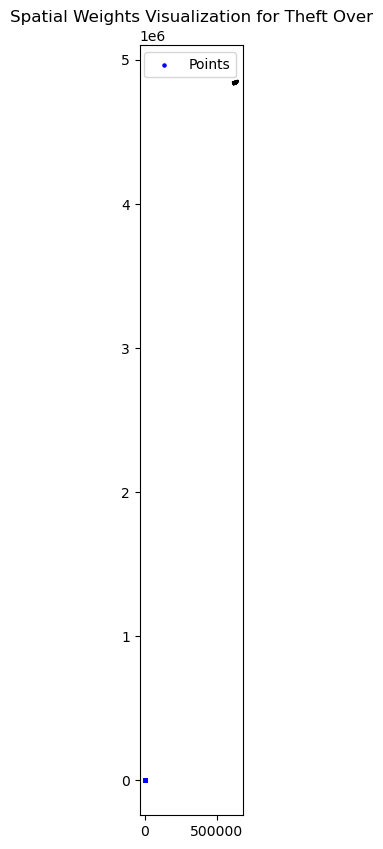

Processing category: Robbery

OLS Regression Summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.233e+06
Date:                Mon, 16 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:33:48   Log-Likelihood:                 1282.5
No. Observations:                1272   AIC:                            -2561.
Df Residuals:                    1270   BIC:                            -2551.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

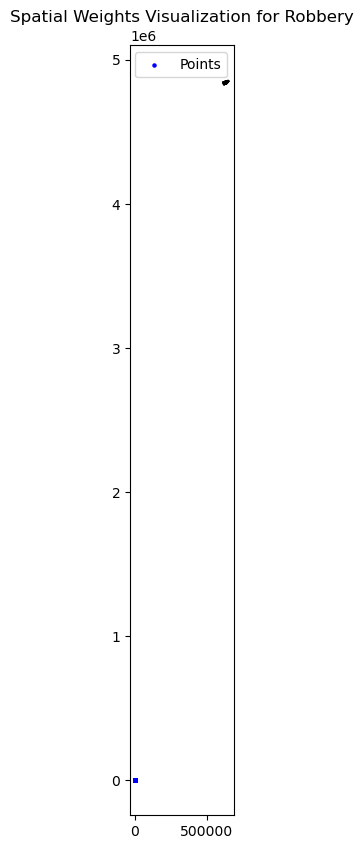

In [95]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
from sklearn.metrics.pairwise import haversine_distances
from statsmodels.api import OLS, add_constant
from scipy.sparse import csr_matrix

# Step 1: Load the CSV and Shapefile
file_path = r"C:\\Users\\User\\Downloads\\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv"
shapefile_path = r"C:\\Users\\User\\Downloads\\Neighbourhood_Crime_Rates_Open_Data_-7850543563477888236\\NEIGHBOURHOOD_CRIME_RATE_OPEN_DATA.shp"

# Load CSV and convert to GeoDataFrame
data = pd.read_csv(file_path)
if not {'LAT_WGS84', 'LONG_WGS84', 'MCI_CATEGORY'}.issubset(data.columns):
    raise ValueError("Required columns ('LAT_WGS84', 'LONG_WGS84', 'MCI_CATEGORY') are missing.")

data = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data.LONG_WGS84, data.LAT_WGS84),
    crs="EPSG:4326",
)

# Load the shapefile as boundary (optional)
boundary = gpd.read_file(shapefile_path)

# Step 2: Iterate over unique MCI categories
unique_categories = data['MCI_CATEGORY'].unique()
for category in unique_categories:
    print(f"Processing category: {category}\n")

    # Filter data for the current category
    category_data = data[data['MCI_CATEGORY'] == category].copy()

    # Ensure there are enough data points for analysis
    if len(category_data) < 5:
        print(f"Skipping {category}: Not enough data points.\n")
        continue

    # Step 3: Calculate Spatial Weights Matrix
    coords = np.radians(category_data[['LAT_WGS84', 'LONG_WGS84']].values)

    # Compute pairwise haversine distances (in radians)
    dist_matrix = haversine_distances(coords, coords) * 6371  # Convert to kilometers

    # Create spatial weights (binary: 1 for neighbors within threshold, 0 otherwise)
    k = 4  # Number of nearest neighbors
    spatial_weights = np.zeros_like(dist_matrix)
    for i, row in enumerate(dist_matrix):
        # Find indices of k-nearest neighbors (excluding self)
        nearest_indices = np.argsort(row)[1:k+1]
        spatial_weights[i, nearest_indices] = 1

    # Normalize weights row-wise
    spatial_weights = spatial_weights / spatial_weights.sum(axis=1, keepdims=True)

    # Convert to sparse matrix
    weights_sparse = csr_matrix(spatial_weights)

    # Step 4: Define Dependent and Independent Variables
    dependent_var = 'LAT_WGS84'  # Placeholder: Replace with actual dependent variable
    independent_vars = ['LONG_WGS84']  # Placeholder: Replace with actual independent variables

    if dependent_var not in category_data.columns or not all(var in category_data.columns for var in independent_vars):
        print(f"Skipping {category}: Required variables are missing.\n")
        continue

    # Drop rows with NaN in selected columns
    model_data = category_data.dropna(subset=[dependent_var] + independent_vars).copy()

    # Step 5: Ordinary Least Squares Regression
    X = add_constant(model_data[independent_vars].values)
    y = model_data[dependent_var].values

    ols_model = OLS(y, X).fit()
    print("OLS Regression Summary:")
    print(ols_model.summary())

    # Step 6: Spatial Lag Model
    lagged_y = spatial_weights @ y
    X_lag = np.hstack((X, lagged_y.reshape(-1, 1)))
    lag_model = OLS(y, X_lag).fit()
    print("\nSpatial Lag Model Summary:")
    print(lag_model.summary())

    # Step 7: Spatial Error Model
    residuals = y - ols_model.predict(X)
    lagged_residuals = spatial_weights @ residuals
    X_err = np.hstack((X, lagged_residuals.reshape(-1, 1)))
    err_model = OLS(y, X_err).fit()
    print("\nSpatial Error Model Summary:")
    print(err_model.summary())

    # Step 8: Visualization (Optional)
    fig, ax = plt.subplots(figsize=(10, 10))
    model_data.plot(ax=ax, color="blue", markersize=5, label="Points")
    boundary.plot(ax=ax, edgecolor="black", facecolor="none", linewidth=1)
    for i, point in enumerate(model_data.geometry):
        neighbors = np.where(spatial_weights[i] > 0)[0]
        for neighbor in neighbors:
            neighbor_point = model_data.geometry.iloc[neighbor]
            plt.plot(
                [point.x, neighbor_point.x], 
                [point.y, neighbor_point.y], 
                color="gray", linewidth=0.5
            )
    ax.set_title(f"Spatial Weights Visualization for {category}")
    plt.legend()
    plt.show()


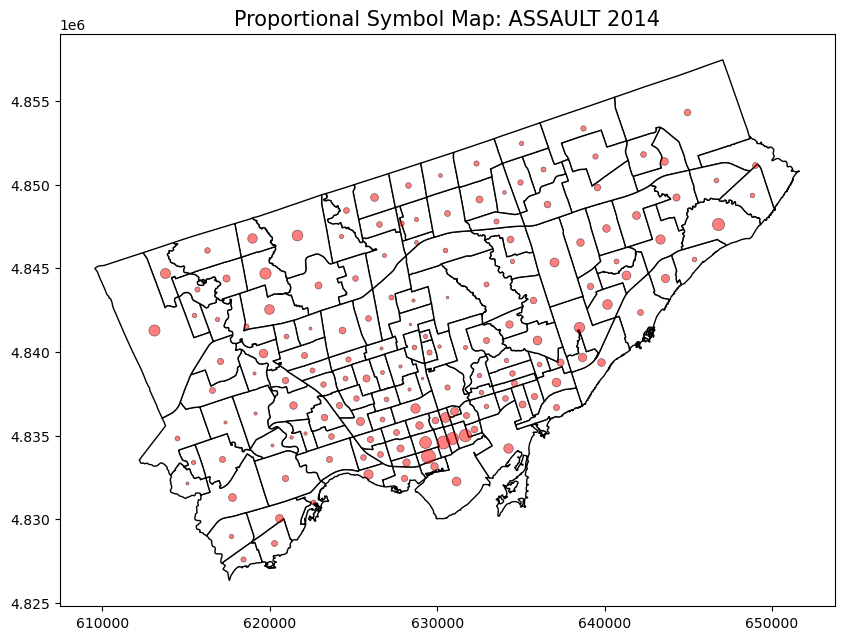

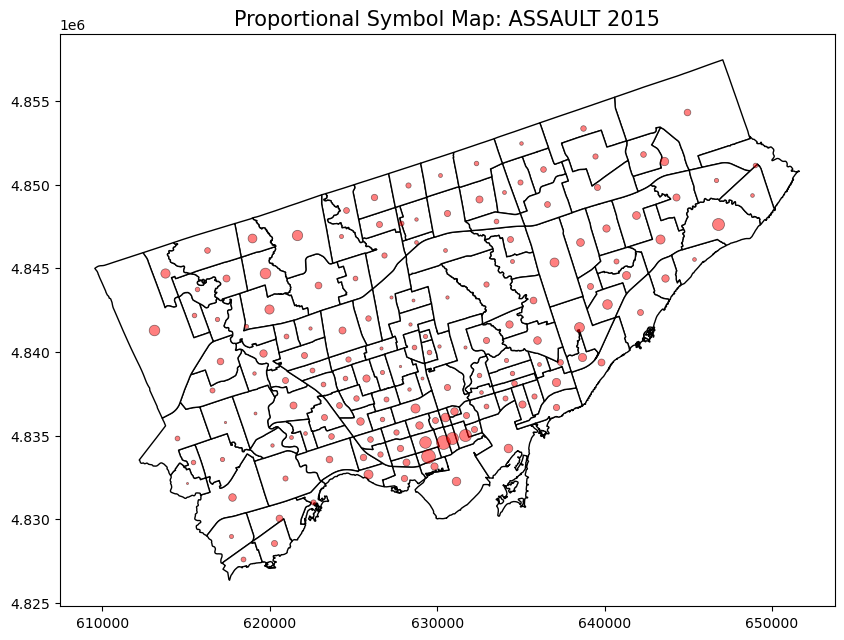

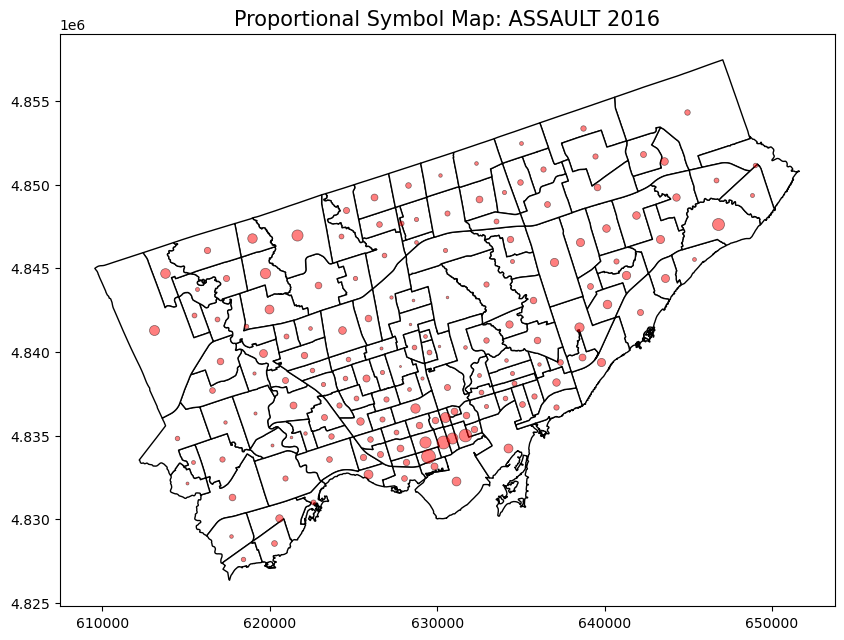

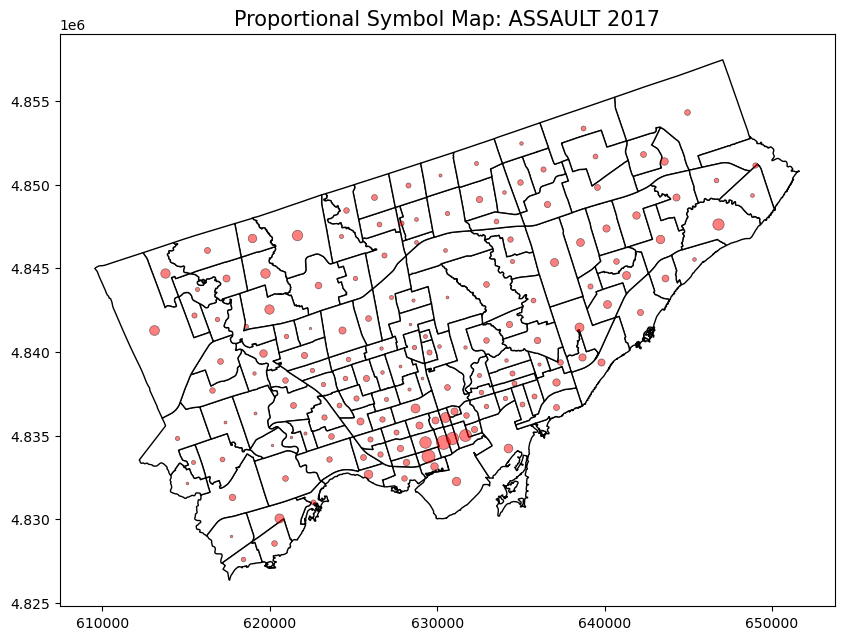

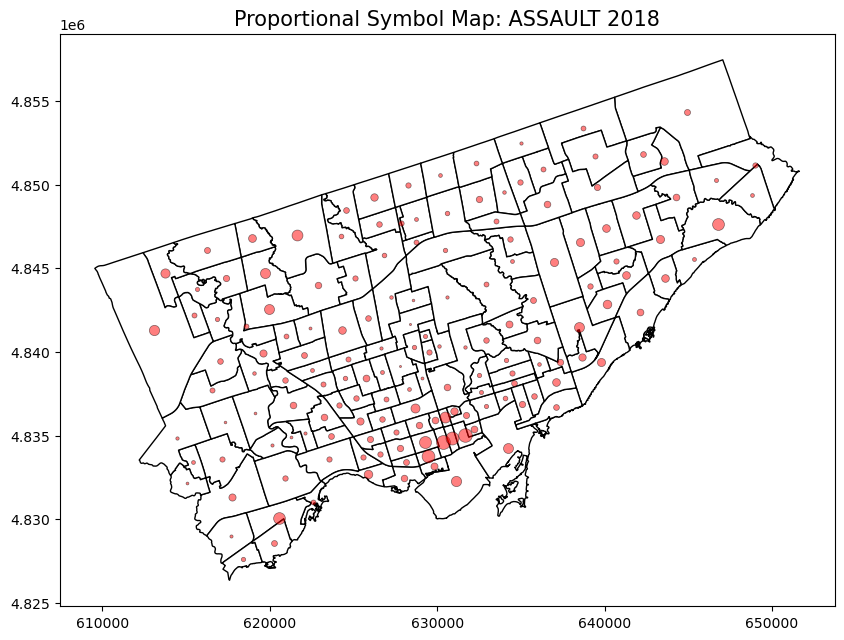

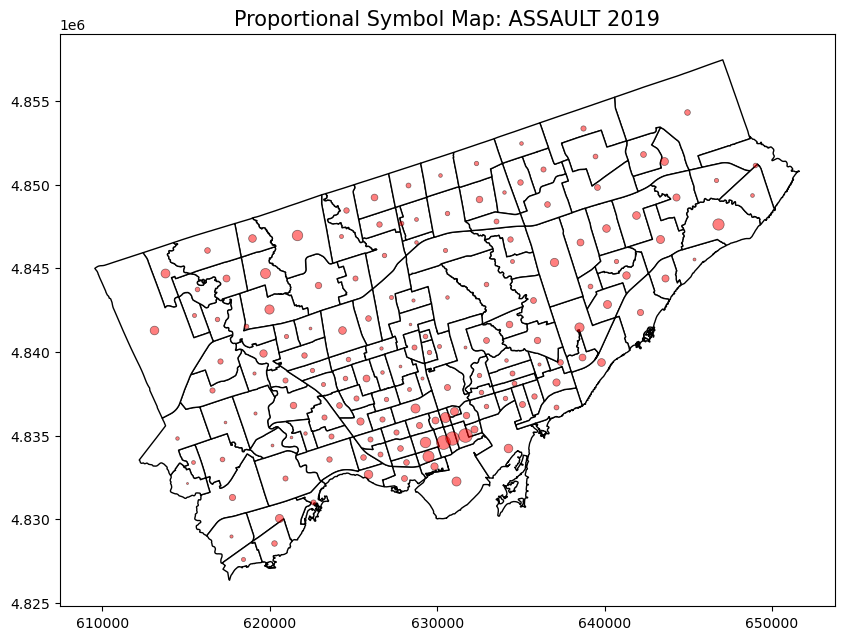

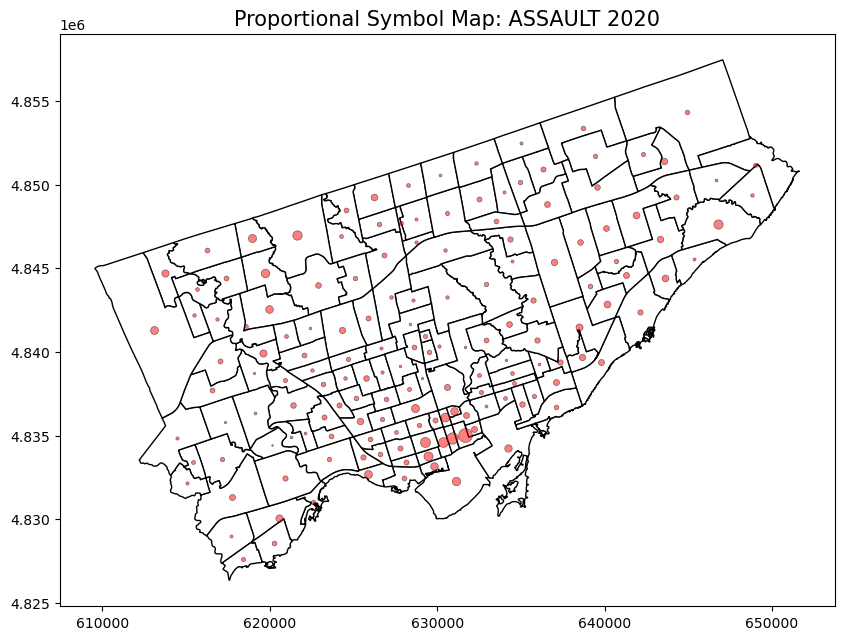

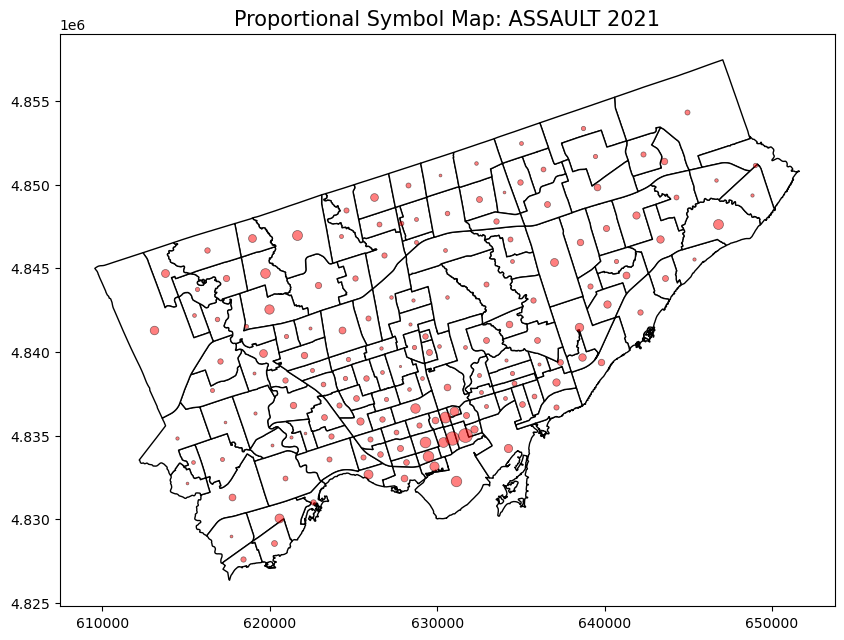

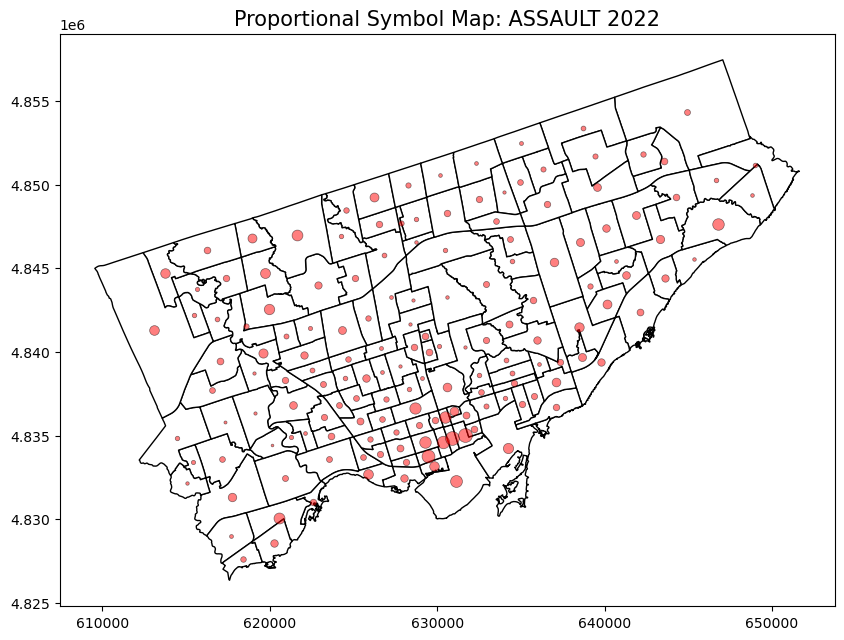

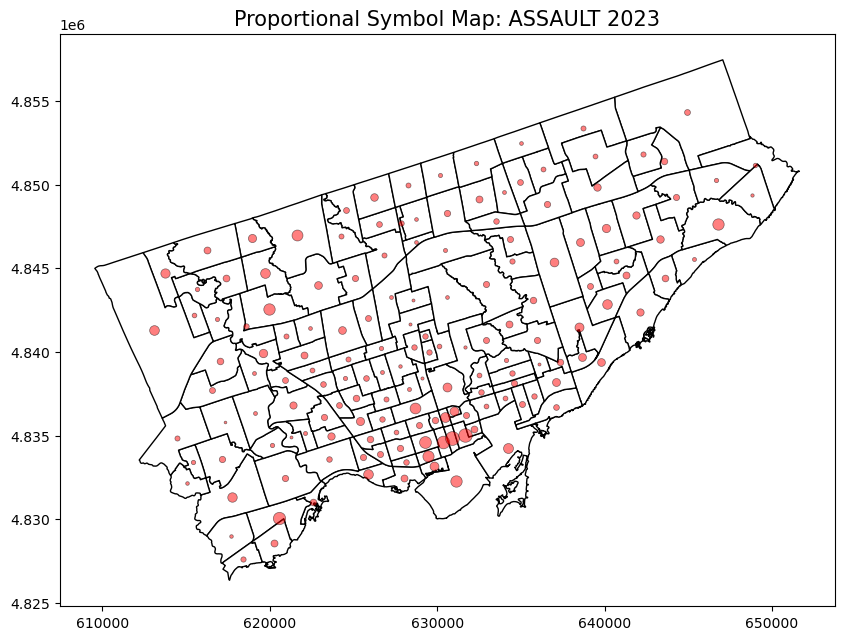

ValueError: too many values to unpack (expected 2)

In [25]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import re

# Load the neighborhood CSV data into pandas DataFrame
csv_file_path = r"C:\Users\User\Downloads\Neighbourhood_Crime_Rates_Open_Data_6759951416839911996.csv"
neighborhood_df = pd.read_csv(csv_file_path)

# Ensure 'NEIGHBOURHOOD_NAME' is present in the CSV data
if 'NEIGHBOURHOOD_NAME' not in neighborhood_df.columns:
    raise KeyError("The column 'NEIGHBOURHOOD_NAME' is not present in the dataset.")

# Load the shapefile containing geometry
shapefile_path = r"C:\Users\User\Downloads\Neighbourhood_Crime_Rates_Open_Data_-7850543563477888236\NEIGHBOURHOOD_CRIME_RATE_OPEN_DATA.shp"
neighborhood_gdf = gpd.read_file(shapefile_path)

# Ensure 'AREA_NAME' and 'geometry' columns are present in the shapefile
if 'AREA_NAME' not in neighborhood_gdf.columns:
    raise KeyError("The column 'AREA_NAME' is not present in the shapefile.")
if 'geometry' not in neighborhood_gdf.columns:
    raise KeyError("The column 'geometry' is not present in the shapefile.")

# Rename 'AREA_NAME' to 'NEIGHBOURHOOD_NAME' in the shapefile
neighborhood_gdf.rename(columns={'AREA_NAME': 'NEIGHBOURHOOD_NAME'}, inplace=True)

# Drop all columns except for 'NEIGHBOURHOOD_NAME' and 'geometry' from shapefile
neighborhood_gdf_geometry = neighborhood_gdf[['NEIGHBOURHOOD_NAME', 'geometry']]

# Merge the geometry from the shapefile with the CSV data on 'NEIGHBOURHOOD_NAME'
neighborhood_df_merged = pd.merge(neighborhood_df, neighborhood_gdf_geometry, on='NEIGHBOURHOOD_NAME', how='left')

# Convert to a GeoDataFrame with the correct CRS
neighborhood_gdf = gpd.GeoDataFrame(neighborhood_df_merged, geometry='geometry', crs=neighborhood_gdf.crs)

# Get the crime columns (e.g., ASSAULT_2014, ASSAULT_2015, etc.)
crime_columns = [col for col in neighborhood_df.columns if re.match(r'^[A-Za-z_]+_\d{4}$', col)]

# Function to create proportional symbol maps for each crime-year
def create_proportional_symbol_map(crime_column, neighborhood_gdf):
    # Extract crime type and year from the column name
    crime_type, year = crime_column.split('_')
    
    # Create a new column for the crime count
    neighborhood_gdf[crime_column] = neighborhood_gdf[crime_column].fillna(0)
    
    # Calculate the proportional size of symbols based on the crime count
    crime_max = neighborhood_gdf[crime_column].max()
    neighborhood_gdf['Symbol_Size'] = neighborhood_gdf[crime_column] / crime_max * 100  # Adjust scaling factor if needed
    
    # Plot the proportional symbol map
    fig, ax = plt.subplots(figsize=(10, 10))
    neighborhood_gdf.plot(ax=ax, color='white', edgecolor='black')
    
    # Add proportional circles (symbol size based on crime count)
    for _, row in neighborhood_gdf.iterrows():
        centroid = row['geometry'].centroid
        ax.scatter(centroid.x, centroid.y, s=row['Symbol_Size'], color='red', alpha=0.5, edgecolors="black", linewidth=0.5)
    
    # Title and legend
    ax.set_title(f'Proportional Symbol Map: {crime_type} {year}', fontsize=15)
    plt.show()

# Create maps for each crime-year column
for crime_column in crime_columns:
    create_proportional_symbol_map(crime_column, neighborhood_gdf)


In [50]:
import pandas as pd

# Load crime data
crime_df = pd.read_csv(r"C:\Users\User\Downloads\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv")

# Ensure LAT_WGS84 and LONG_WGS84 are numeric (optional)
crime_df['LAT_WGS84'] = pd.to_numeric(crime_df['LAT_WGS84'], errors='coerce')
crime_df['LONG_WGS84'] = pd.to_numeric(crime_df['LONG_WGS84'], errors='coerce')

# Remove rows with missing coordinates
crime_df = crime_df.dropna(subset=['LAT_WGS84', 'LONG_WGS84'])

# Dictionary to store extracted coordinates for each offence
offence_coordinates = {}

# Loop through each unique offence type
for offence in crime_df['OFFENCE'].unique():
    # Filter rows for the specific offence
    offence_df = crime_df[crime_df['OFFENCE'] == offence]
    
    # Extract latitude and longitude as a list of tuples
    coordinates = list(zip(offence_df['LAT_WGS84'], offence_df['LONG_WGS84']))
    
    # Store in the dictionary
    offence_coordinates[offence] = coordinates

# Print the extracted coordinates for each offence
for offence, coords in offence_coordinates.items():
    print(f"Offence: {offence}, Number of Incidents: {len(coords)}")
    print(coords[:5])  # Print the first 5 coordinates as a sample


Offence: Assault, Number of Incidents: 7897
[(43.6769501218638, -79.3895188524168), (43.6683471074508, -79.3820262502107), (43.7074200556489, -79.4655863549672), (43.6703229343187, -79.4557654207592), (43.7317983366152, -79.3131712546335)]
Offence: Assault With Weapon, Number of Incidents: 2169
[(43.7097065340631, -79.534526332596), (43.7097065340631, -79.534526332596), (43.8105301135478, -79.2139543826053), (0.0, 0.0), (43.7261626711513, -79.413357624864)]
Offence: Theft Of Motor Vehicle, Number of Incidents: 3870
[(43.7432591737937, -79.5821063701517), (43.7509621842886, -79.5411221978226), (43.6892086437043, -79.5822533054013), (43.7117153100755, -79.5666725562532), (43.747587894033, -79.1992925930958)]
Offence: B&E, Number of Incidents: 2233
[(43.5908084893526, -79.5224998209222), (43.7688473713894, -79.4669164568278), (43.6605697996736, -79.3820870470184), (43.6420382839732, -79.4119534293475), (43.7078106501642, -79.4882397426145)]
Offence: Theft Over, Number of Incidents: 557
[(

In [36]:
import folium
from folium.plugins import HeatMap

# Create a base map
map_heatmap = folium.Map(location=[crime_df['LAT_WGS84'].mean(), crime_df['LONG_WGS84'].mean()], zoom_start=12)

# Add heatmap
heat_data = crime_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()
HeatMap(heat_data).add_to(map_heatmap)

# Save or display the map
map_heatmap.save("crime_heatmap.html")


In [44]:
# Drop coordinates where latitude is below 40 and longitude is below 70
for offence, coords in offence_coordinates.items():
    # Filter out coordinates with latitude < 40 or longitude < 70
    offence_coordinates[offence] = [coord for coord in coords if coord[0] >= 40 and coord[1] >= 70]

# Now the `offence_coordinates` dictionary will only contain valid coordinates


In [46]:
# Iterate over the offence_coordinates dictionary
for offence, coords in offence_coordinates.items():
    # Use a list comprehension to filter out invalid coordinates
    offence_coordinates[offence] = [coord for coord in coords if coord[0] >= 40 and coord[1] >= 70]

# Now, the offence_coordinates dictionary will only contain valid coordinates


Moran's I: nan, p-value: 0.001
Significant spatial autocorrelation detected (hotspot).


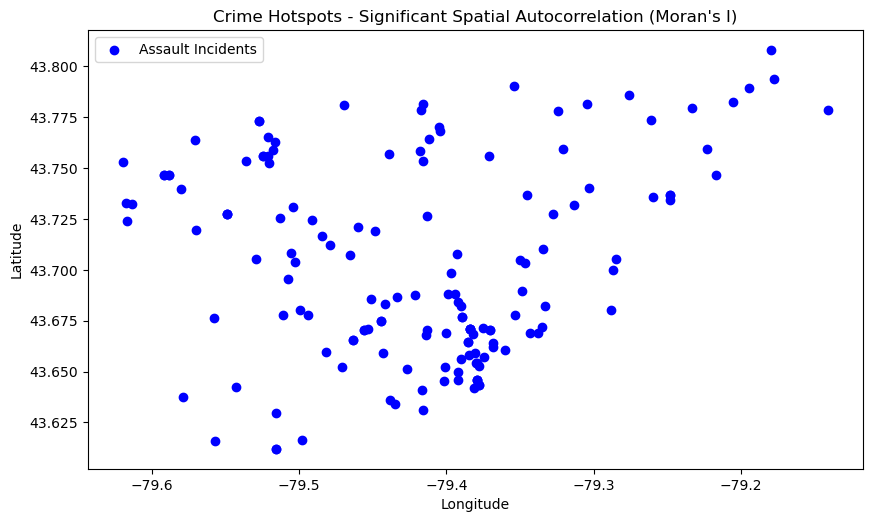

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from pysal.lib import weights
from pysal.explore import esda
import geopandas as gpd

# Step 1: Assume assault_coords is already available
# For example, let's use some dummy coordinates here
assault_coords = [(43.6769501218638, -79.3895188524168), (43.6683471074508, -79.3820262502107), (43.7074200556489, -79.4655863549672), (43.6703229343187, -79.4557654207592), (43.7317983366152, -79.3131712546335), (43.6642795033832, -79.3679694576666), (43.7261626711513, -79.413357624864), (43.6983014289463, -79.3966084555738), (43.6703229343187, -79.4557654207592),  (43.755738585647, -79.521133610718), (43.6708037100493, -79.3841910505493), (43.6708037100493, -79.3841910505493), (43.7272962290426, -79.5493287722058), (43.6454807851952, -79.4018319327213),  (43.6776982155463, -79.5112525907745), (43.7341508830067, -79.248112037935), (43.7401053392328, -79.3033834799914), (43.7210128541803, -79.4601103117171), (43.6120798127361, -79.5158140495646), (43.7122331494182, -79.4788325385817), (43.7524838821253, -79.5201832096406), (43.6311116719788, -79.4155486288905), (43.7246344464395, -79.4911046451337), (43.7463621696445, -79.5919235662702), (43.7463621696445, -79.5919235662702), (43.652267792395, -79.4011055337186), (43.6712851104028, -79.374961656886), (43.8079165895327, -79.1795012918098), (43.6526733917771, -79.3780802470574), (43.6804394381785, -79.288219556171), (43.7636058174777, -79.5707372357399), (43.7786522742218, -79.1408261419103), (43.7683120886537, -79.4043657923378), (43.7272962290426, -79.5493287722058), (43.7272962290426, -79.5493287722058), (43.7530323203269, -79.6195234062403), (43.7366919813127, -79.248072441376), (43.6296545724136, -79.5155484132405), (43.7078912128797, -79.3928082545869), (43.6801188044938, -79.4994671905769), (43.7310150745973, -79.504371057469), (43.7038745529043, -79.5028942461269), (43.6687811498208, -79.3375618971235), (43.7049598858721, -79.3497693189441), (43.7326380514104, -79.6177919867938), (43.6882724389014, -79.3987834579203), (43.6647392038429, -79.3854400468752), (43.7902807372675, -79.3541490378226), (43.7639944873769, -79.4115541917736), (43.6894121992519, -79.3488165151935), (43.7165751464708, -79.4844778402696), (43.6562145953183, -79.3897388426008), (43.6780213530755, -79.3535141906573), (43.6718221642112, -79.3353275049561), (43.7808278798243, -79.4697965560606), (43.6702789107129, -79.3703929599192), (43.6120798127361, -79.5158140495646), (43.616128509042, -79.5569433874087), (43.6868376910607, -79.4331964131327), (43.7736533589394, -79.2611363234557), (43.6822773371162, -79.3901235593982), (43.7463184731693, -79.5881393689254), (43.7463184731693, -79.5881393689254), (43.7627628868418, -79.5164532137613), (43.6459171850208, -79.3790877444954), (43.6822734982468, -79.3327060224312), (43.6411118829918, -79.4165977277994), (43.6606597997636, -79.3604714620345), (43.7001000127995, -79.2867250682331), (43.7099883759954, -79.3344442298919), (43.723747405693, -79.6169188917856), (43.6162187957559, -79.4983879275447), (43.6702789107129, -79.3703929599192), (43.7531815898242, -79.4157293120659), (43.6459171850208, -79.3790877444954), (43.7194023454745, -79.5703900759407), (43.6954779690246, -79.5072747633808), (43.7558575872321, -79.5242574098528), (43.7558575872321, -79.5242574098528), (43.677781912874, -79.4937078956125), (43.6459171850208, -79.3790877444954), (43.659218312715, -79.4430333192819), (43.6880336442218, -79.3940734629841), (43.6647392038429, -79.3854400468752), (43.7700533892342, -79.4051035837021), (43.6762168606378, -79.557923292996), (43.6431728822766, -79.3779175452756), (43.6431728822766, -79.3779175452756), (43.7593621211978, -79.3209136681278), (43.6515054971899, -79.4265719244747), (43.65418629329, -79.3793664467043), (43.7532112871536, -79.5362220033481), (43.7368287095358, -79.3450285162261), (43.7273427353489, -79.3277810325898), (43.6708037100493, -79.3841910505493), (43.7816329965267, -79.4159903445941), (43.7366919813127, -79.248072441376), (43.7582819866792, -79.418111100829), (43.6596755684908, -79.4817730242628), (43.6653980520259, -79.4632777252039), (43.6687345107192, -79.4003094411357), (43.7051854045986, -79.284940572493), (43.6339777793376, -79.4347921217346), (43.6653980520259, -79.4632777252039), (43.7191307567301, -79.4481784199008), (43.657067296171, -79.3745305508885), (43.7567835763184, -79.4387835259638), (43.7357688808867, -79.2598953237223), (43.7559193959145, -79.3712409228682), (43.7816444351148, -79.3047114802163), (43.6703106156868, -79.4132547357595), (43.6540727931765, -79.3799562462733), (43.6593547984586, -79.3807817474836), (43.7938889896319, -79.177217991069), (43.6708037100493, -79.3841910505493), (43.6423178222639, -79.5431329885774), (43.6580892971931, -79.3846897449087), (43.7321698925754, -79.6133075830361), (43.6460378851415, -79.3923131372375),  (43.7795367012386, -79.2329648460509), (43.6707148293765, -79.4532477200319), (43.7084272464395, -79.505284642677), (43.7777455236864, -79.3241704680324), (43.7592653022684, -79.2228286604979), (43.782596196216, -79.204963406117), (43.7892721934831, -79.1943439807371), (43.6839342400011, -79.3923800598237), (43.7728491665585, -79.5275580023559), (43.7728491665585, -79.5275580023559), (43.6769501218638, -79.3895188524168), (43.662039301143, -79.3685260565488), (43.652265439802, -79.4711764188116), (43.6496469887506, -79.3921049384829), (43.6854490893208, -79.4508839027374), (43.6830435984655, -79.4415043126075), (43.725526649875, -79.5131838452821), (43.7032343898983, -79.3466150216221), (43.6375604324959, -79.5789494934141), (43.7397023731706, -79.5803360707393), (43.7783943975026, -79.4172854500919), (43.6358942830636, -79.438304120564), (43.7859363567169, -79.2760280098597), (43.6678537127618, -79.4135817342543), (43.7589951861319, -79.5177062123027), (43.674973724221, -79.4446284212337), (43.674973724221, -79.4446284212337), (43.6417547808585, -79.3810046432175), (43.6876244046491, -79.4214316256499), (43.6691477381864, -79.3433646889761), (43.7051658512575, -79.5293627426054), (43.7467196863066, -79.2168288932624), (43.7651027857917, -79.5209741131999)]

# Step 2: Create spatial weights from the latitude and longitude of each incident
coords = np.array(assault_coords)  # Coordinates for the offence (e.g., Assault)
w = weights.DistanceBand(coords, threshold=0.05)  # You can adjust the threshold

# Step 3: Compute Moran's I for spatial autocorrelation
moran = esda.Moran(np.ones(len(coords)), w)  # Using a constant 1 for each observation (can use crime counts or other metrics)
print(f"Moran's I: {moran.I}, p-value: {moran.p_sim}")

# Step 4: Interpret Moran's I
if moran.p_sim < 0.05:
    print("Significant spatial autocorrelation detected (hotspot).")
else:
    print("No significant spatial autocorrelation detected.")

# Step 5: Visualize the spatial distribution and Moran's I result
# Create a GeoDataFrame for plotting
gdf = gpd.GeoDataFrame(geometry=gpd.points_from_xy(coords[:, 1], coords[:, 0]), crs="EPSG:4326")

# Plot the coordinates of the incidents
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, marker='o', color='blue', label="Assault Incidents")

# Highlight points based on proximity (hotspots from Moran's I interpretation)
if moran.p_sim < 0.05:
    ax.set_title("Crime Hotspots - Significant Spatial Autocorrelation (Moran's I)")
else:
    ax.set_title("Crime Incidents - No Significant Spatial Autocorrelation (Moran's I)")

# Add labels and legends
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend()

plt.show()


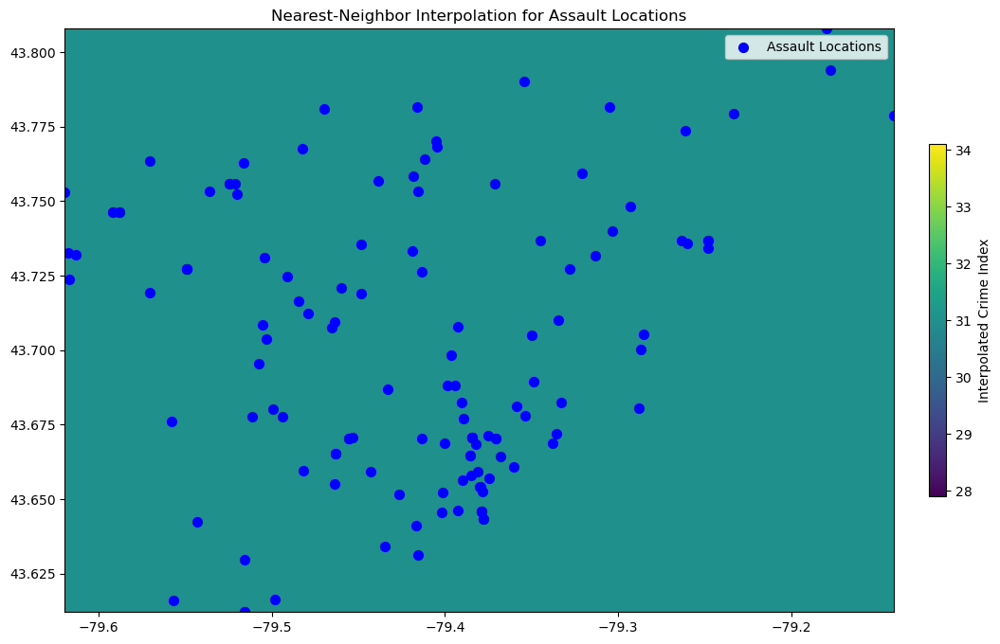

In [59]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
from scipy.interpolate import griddata

# Step 1: Define the Assault Coordinates
assault_coords = [
    (43.6769501218638, -79.3895188524168), (43.6683471074508, -79.3820262502107),
    (43.7074200556489, -79.4655863549672), (43.6703229343187, -79.4557654207592),
    (43.7317983366152, -79.3131712546335), (43.6642795033832, -79.3679694576666),
    (43.7261626711513, -79.413357624864), (43.6983014289463, -79.3966084555738),
    (43.6703229343187, -79.4557654207592), (43.755738585647, -79.521133610718),
    (43.6708037100493, -79.3841910505493), (43.6708037100493, -79.3841910505493),
    (43.7272962290426, -79.5493287722058), (43.6454807851952, -79.4018319327213),
    (43.6776982155463, -79.5112525907745), (43.7341508830067, -79.248112037935),
    (43.7401053392328, -79.3033834799914), (43.7210128541803, -79.4601103117171),
    (43.6120798127361, -79.5158140495646), (43.7122331494182, -79.4788325385817),
    (43.7524838821253, -79.5201832096406), (43.6311116719788, -79.4155486288905),
    (43.7246344464395, -79.4911046451337), (43.7463621696445, -79.5919235662702),
    (43.7463621696445, -79.5919235662702), (43.652267792395, -79.4011055337186),
    (43.6712851104028, -79.374961656886), (43.8079165895327, -79.1795012918098),
    (43.6526733917771, -79.3780802470574), (43.6804394381785, -79.288219556171),
    (43.7636058174777, -79.5707372357399), (43.7786522742218, -79.1408261419103),
    (43.7683120886537, -79.4043657923378), (43.7272962290426, -79.5493287722058),
    (43.7272962290426, -79.5493287722058), (43.7530323203269, -79.6195234062403),
    (43.7366919813127, -79.248072441376), (43.6296545724136, -79.5155484132405),
    (43.7078912128797, -79.3928082545869), (43.6801188044938, -79.4994671905769),
    (43.7310150745973, -79.504371057469), (43.7038745529043, -79.5028942461269),
    (43.6687811498208, -79.3375618971235), (43.7049598858721, -79.3497693189441),
    (43.7326380514104, -79.6177919867938), (43.6882724389014, -79.3987834579203),
    (43.6647392038429, -79.3854400468752), (43.7902807372675, -79.3541490378226),
    (43.7639944873769, -79.4115541917736), (43.6894121992519, -79.3488165151935),
    (43.7165751464708, -79.4844778402696), (43.6562145953183, -79.3897388426008),
    (43.6780213530755, -79.3535141906573), (43.6718221642112, -79.3353275049561),
    (43.7808278798243, -79.4697965560606), (43.6702789107129, -79.3703929599192),
    (43.6120798127361, -79.5158140495646), (43.616128509042, -79.5569433874087),
    (43.6868376910607, -79.4331964131327), (43.7736533589394, -79.2611363234557),
    (43.6822773371162, -79.3901235593982), (43.7463184731693, -79.5881393689254),
    (43.7463184731693, -79.5881393689254), (43.7627628868418, -79.5164532137613),
    (43.6459171850208, -79.3790877444954), (43.6822734982468, -79.3327060224312),
    (43.6411118829918, -79.4165977277994), (43.6606597997636, -79.3604714620345),
    (43.7001000127995, -79.2867250682331), (43.7099883759954, -79.3344442298919),
    (43.723747405693, -79.6169188917856), (43.6162187957559, -79.4983879275447),
    (43.6702789107129, -79.3703929599192), (43.7531815898242, -79.4157293120659),
    (43.6459171850208, -79.3790877444954), (43.7194023454745, -79.5703900759407),
    (43.6954779690246, -79.5072747633808), (43.7558575872321, -79.5242574098528),
    (43.7558575872321, -79.5242574098528), (43.677781912874, -79.4937078956125),
    (43.6459171850208, -79.3790877444954), (43.659218312715, -79.4430333192819),
    (43.6880336442218, -79.3940734629841), (43.6647392038429, -79.3854400468752),
    (43.7700533892342, -79.4051035837021), (43.6762168606378, -79.557923292996),
    (43.6431728822766, -79.3779175452756), (43.6431728822766, -79.3779175452756),
    (43.7593621211978, -79.3209136681278), (43.6515054971899, -79.4265719244747),
    (43.65418629329, -79.3793664467043), (43.7532112871536, -79.5362220033481),
    (43.7368287095358, -79.3450285162261), (43.7273427353489, -79.3277810325898),
    (43.6708037100493, -79.3841910505493), (43.7816329965267, -79.4159903445941),
    (43.7366919813127, -79.248072441376), (43.7582819866792, -79.418111100829),
    (43.6596755684908, -79.4817730242628), (43.6653980520259, -79.4632777252039),
    (43.6687345107192, -79.4003094411357), (43.7051854045986, -79.284940572493),
    (43.6339777793376, -79.4347921217346), (43.6653980520259, -79.4632777252039),
    (43.7191307567301, -79.4481784199008), (43.657067296171, -79.3745305508885),
    (43.7567835763184, -79.4387835259638), (43.7357688808867, -79.2598953237223),
    (43.7559193959145, -79.3712409228682), (43.7816444351148, -79.3047114802163),
    (43.6703106156868, -79.4132547357595), (43.6540727931765, -79.3799562462733),
    (43.6593547984586, -79.3807817474836), (43.7938889896319, -79.177217991069),
    (43.6708037100493, -79.3841910505493), (43.6423178222639, -79.5431329885774),
    (43.6580892971931, -79.3846897449087), (43.7321698925754, -79.6133075830361),
    (43.6460378851415, -79.3923131372375), (43.7795367012386, -79.2329648460509),
    (43.6707148293765, -79.4532477200319), (43.7084272464395, -79.505284642677),
    (43.7356240395911, -79.448444649936), (43.6810612050795, -79.3587586874472),
    (43.6550211458638, -79.463508197287), (43.7094968763175, -79.463653400787),
    (43.7674960872629, -79.4822971631212), (43.7333771046802, -79.4188652499199),
    (43.7367245801502, -79.2634295138707), (43.7482814939161, -79.2929332901211),
]

# Step 2: Prepare the Grid for Interpolation
x_min, x_max = min([coord[1] for coord in assault_coords]), max([coord[1] for coord in assault_coords])
y_min, y_max = min([coord[0] for coord in assault_coords]), max([coord[0] for coord in assault_coords])

# Define grid resolution
grid_res = 0.01
grid_x, grid_y = np.meshgrid(
    np.arange(x_min, x_max, grid_res),
    np.arange(y_min, y_max, grid_res)
)

# Step 3: Perform Nearest-Neighbor Interpolation
points = np.array(assault_coords)
values = np.arange(len(points))  # Placeholder values for the coordinates (indexing)

# Interpolate using griddata (nearest-neighbor method)
grid_z_nn = griddata(points, values, (grid_x, grid_y), method='nearest')

# Step 4: Visualize the Results
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Plot the interpolation
interpolation = ax.imshow(
    grid_z_nn,
    extent=(x_min, x_max, y_min, y_max),
    origin='lower',
    cmap=cm.viridis,
    aspect='auto'
)

# Plot assault locations
ax.scatter(
    [coord[1] for coord in assault_coords], [coord[0] for coord in assault_coords],
    c='blue', s=50, label='Assault Locations'
)

# Add colorbar
cbar = plt.colorbar(interpolation, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label('Interpolated Crime Index')

# Add title and legend
ax.set_title("Nearest-Neighbor Interpolation for Assault Locations")
ax.legend()

# Show plot
plt.show()


In [65]:
import folium
from folium.plugins import MarkerCluster

# Step 1: Define the assault coordinates
assault_coords = [
    (43.6769501218638, -79.3895188524168), (43.6683471074508, -79.3820262502107),
    (43.7074200556489, -79.4655863549672), (43.6703229343187, -79.4557654207592),
    (43.7317983366152, -79.3131712546335), (43.6642795033832, -79.3679694576666),
    (43.7261626711513, -79.413357624864), (43.6983014289463, -79.3966084555738),
    (43.6703229343187, -79.4557654207592), (43.755738585647, -79.521133610718),
    (43.6708037100493, -79.3841910505493), (43.6708037100493, -79.3841910505493),
    (43.7272962290426, -79.5493287722058), (43.6454807851952, -79.4018319327213),
    (43.6776982155463, -79.5112525907745), (43.7341508830067, -79.248112037935),
    (43.7401053392328, -79.3033834799914), (43.7210128541803, -79.4601103117171),
    (43.6120798127361, -79.5158140495646), (43.7122331494182, -79.4788325385817),
    (43.7524838821253, -79.5201832096406), (43.6311116719788, -79.4155486288905),
    (43.7246344464395, -79.4911046451337), (43.7463621696445, -79.5919235662702),
    (43.7463621696445, -79.5919235662702), (43.652267792395, -79.4011055337186),
    (43.6712851104028, -79.374961656886), (43.8079165895327, -79.1795012918098),
    (43.6526733917771, -79.3780802470574), (43.6804394381785, -79.288219556171),
    (43.7636058174777, -79.5707372357399), (43.7786522742218, -79.1408261419103),
    (43.7683120886537, -79.4043657923378), (43.7272962290426, -79.5493287722058),
    (43.7272962290426, -79.5493287722058), (43.7530323203269, -79.6195234062403),
    (43.7366919813127, -79.248072441376), (43.6296545724136, -79.5155484132405),
    (43.7078912128797, -79.3928082545869), (43.6801188044938, -79.4994671905769),
    (43.7310150745973, -79.504371057469), (43.7038745529043, -79.5028942461269),
    (43.6687811498208, -79.3375618971235), (43.7049598858721, -79.3497693189441),
    (43.7326380514104, -79.6177919867938), (43.6882724389014, -79.3987834579203),
    (43.6647392038429, -79.3854400468752), (43.7902807372675, -79.3541490378226),
    (43.7639944873769, -79.4115541917736), (43.6894121992519, -79.3488165151935),
    (43.7165751464708, -79.4844778402696), (43.6562145953183, -79.3897388426008),
    (43.6780213530755, -79.3535141906573), (43.6718221642112, -79.3353275049561),
    (43.7808278798243, -79.4697965560606), (43.6702789107129, -79.3703929599192),
    (43.6120798127361, -79.5158140495646), (43.616128509042, -79.5569433874087),
    (43.6868376910607, -79.4331964131327), (43.7736533589394, -79.2611363234557),
    (43.6822773371162, -79.3901235593982), (43.7463184731693, -79.5881393689254),
    (43.7463184731693, -79.5881393689254), (43.7627628868418, -79.5164532137613),
    (43.6459171850208, -79.3790877444954), (43.6822734982468, -79.3327060224312),
    (43.6411118829918, -79.4165977277994), (43.6606597997636, -79.3604714620345),
    (43.7001000127995, -79.2867250682331), (43.7099883759954, -79.3344442298919),
    (43.723747405693, -79.6169188917856), (43.6162187957559, -79.4983879275447),
    (43.6702789107129, -79.3703929599192), (43.7531815898242, -79.4157293120659),
    (43.6459171850208, -79.3790877444954), (43.7194023454745, -79.5703900759407),
    (43.6954779690246, -79.5072747633808), (43.7558575872321, -79.5242574098528),
    (43.7558575872321, -79.5242574098528), (43.677781912874, -79.4937078956125),
    (43.6459171850208, -79.3790877444954), (43.659218312715, -79.4430333192819),
    (43.6880336442218, -79.3940734629841), (43.6647392038429, -79.3854400468752),
    (43.7700533892342, -79.4051035837021), (43.6762168606378, -79.557923292996),
    (43.6431728822766, -79.3779175452756), (43.6431728822766, -79.3779175452756),
    (43.7593621211978, -79.3209136681278), (43.6515054971899, -79.4265719244747),
    (43.65418629329, -79.3793664467043), (43.7532112871536, -79.5362220033481),
    (43.7368287095358, -79.3450285162261), (43.7273427353489, -79.3277810325898),
    (43.6708037100493, -79.3841910505493), (43.7816329965267, -79.4159903445941),
    (43.7366919813127, -79.248072441376), (43.7582819866792, -79.418111100829),
    (43.6596755684908, -79.4817730242628), (43.6653980520259, -79.4632777252039),
    (43.6687345107192, -79.4003094411357), (43.7051854045986, -79.284940572493),
    (43.6339777793376, -79.4347921217346), (43.6653980520259, -79.4632777252039),
    (43.7191307567301, -79.4481784199008), (43.657067296171, -79.3745305508885),
    (43.7567835763184, -79.4387835259638), (43.7357688808867, -79.2598953237223),
    (43.7559193959145, -79.3712409228682), (43.7816444351148, -79.3047114802163),
    (43.6703106156868, -79.4132547357595), (43.6540727931765, -79.3799562462733),
    (43.6593547984586, -79.3807817474836), (43.7938889896319, -79.177217991069),
    (43.6708037100493, -79.3841910505493), (43.6423178222639, -79.5431329885774),
    (43.6580892971931, -79.3846897449087), (43.7321698925754, -79.6133075830361),
    (43.6460378851415, -79.3923131372375), (43.7795367012386, -79.2329648460509),
    (43.6707148293765, -79.4532477200319), (43.7084272464395, -79.505284642677),
    (43.7356240395911, -79.448444649936), (43.6810612050795, -79.3587586874472),
    (43.6550211458638, -79.463508197287), (43.7094968763175, -79.463653400787),
    (43.7674960872629, -79.4822971631212), (43.7333771046802, -79.4188652499199),
    (43.7367245801502, -79.2634295138707), (43.7482814939161, -79.2929332901211),
]


# Step 2: Initialize the map centered around Toronto
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=12)  # Adjust location and zoom as needed

# Step 3: Initialize a MarkerCluster to handle markers
marker_cluster = MarkerCluster().add_to(toronto_map)

# Step 4: Add assault locations as markers
for coord in assault_coords:
    folium.Marker(
        location=coord,
        popup=f'Assault Location: {coord}',
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(marker_cluster)

# Step 5: Save the map to an HTML file
map_file = 'toronto_assault_map.html'
toronto_map.save(map_file)

# Optionally, display the map inline if running in a Jupyter environment
toronto_map



Processing Offence: Administering Noxious Thing


C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


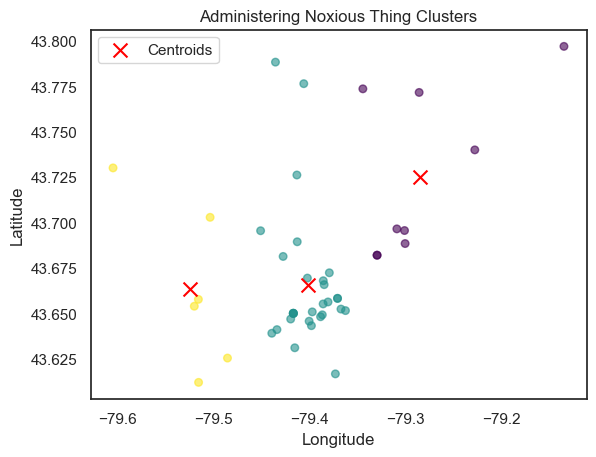

Map for Administering Noxious Thing saved as 'administering_noxious_thing_clusters_map.html'.

Processing Offence: Aggravated Aslt Peace Officer


ValueError: n_samples=1 should be >= n_clusters=3.

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import folium

# Step 1: Load Data Automatically
file_path = "C:\\Users\User\\Downloads\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv"# Path to the uploaded file
data = pd.read_csv(file_path)

# Step 2: Filter Valid Data
data = data[(data['LAT_WGS84'] != 0) & (data['LONG_WGS84'] != 0)]  # Remove invalid (0,0) points

# Step 3: Group Coordinates by Offence
offence_groups = data.groupby('OFFENCE')[['LAT_WGS84', 'LONG_WGS84']]

# Function to perform K-Means clustering
def perform_kmeans(coords, n_clusters=3):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(coords)
    return kmeans

# Function to plot clusters
def plot_clusters(coords, kmeans, title):
    plt.scatter(coords[:, 1], coords[:, 0], c=kmeans.labels_, cmap='viridis', s=30, alpha=0.6)
    plt.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 0], c='red', marker='x', s=100, label='Centroids')
    plt.title(title)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.show()

# Function to create Folium map
def create_folium_map(coords, kmeans, title):
    map_center = [np.mean(coords[:, 0]), np.mean(coords[:, 1])]
    crime_map = folium.Map(location=map_center, zoom_start=12)
    
    for i, coord in enumerate(coords):
        cluster_label = kmeans.labels_[i]
        folium.CircleMarker(
            location=coord, 
            radius=5,
            color=['blue', 'green', 'orange'][cluster_label % 3],
            fill=True,
            fill_opacity=0.6
        ).add_to(crime_map)
    
    for centroid in kmeans.cluster_centers_:
        folium.Marker(
            location=centroid, 
            icon=folium.Icon(color='red', icon='info-sign'),
            popup="Cluster Centroid"
        ).add_to(crime_map)
    
    return crime_map

# Step 4: K-Means for Each Offence
for offence, group in offence_groups:
    print(f"\nProcessing Offence: {offence}")
    coords = group[['LAT_WGS84', 'LONG_WGS84']].values
    kmeans = perform_kmeans(coords, n_clusters=3)
    
    # Plot Clusters
    plot_clusters(coords, kmeans, f"{offence} Clusters")
    
    # Create and Save Folium Map
    crime_map = create_folium_map(coords, kmeans, f"{offence} Clusters")
    map_file = f"{offence}_clusters_map.html".lower().replace(" ", "_")
    crime_map.save(map_file)
    print(f"Map for {offence} saved as '{map_file}'.")



Processing Offence: Assault


C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


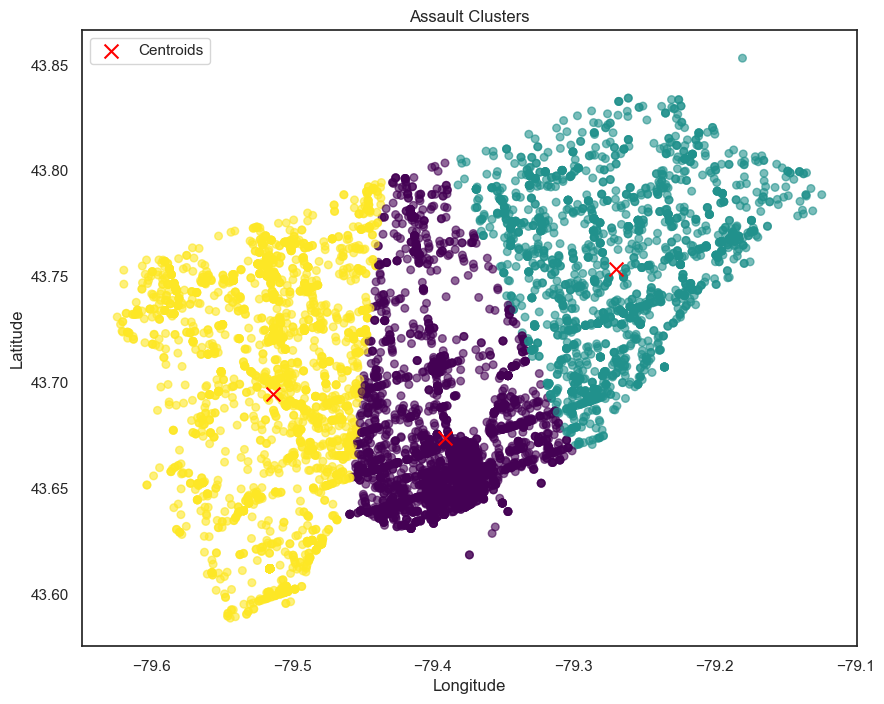

Map for Assault saved as 'assault_clusters_map.html'.


In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import folium

# Step 1: Load Data Automatically
file_path = r"C:\\Users\User\\Downloads\\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv"  # Path to the uploaded file
data = pd.read_csv(file_path)

# Step 2: Filter Valid Data and Target Offences
data = data[(data['LAT_WGS84'] != 0) & (data['LONG_WGS84'] != 0)]  # Remove invalid (0,0) points
data = data[data['OFFENCE'].isin(['Assault', 'Robbery'])]  # Keep only Assault and Robbery

# Step 3: Group Coordinates by Offence
offence_groups = data.groupby('OFFENCE')[['LAT_WGS84', 'LONG_WGS84']]

# Function to perform K-Means clustering
def perform_kmeans(coords, n_clusters=3):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(coords)
    return kmeans

# Function to plot clusters
def plot_clusters(coords, kmeans, title):
    plt.figure(figsize=(10, 8))  # Adjust figure size
    plt.scatter(coords[:, 1], coords[:, 0], c=kmeans.labels_, cmap='viridis', s=30, alpha=0.6)
    plt.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 0], c='red', marker='x', s=100, label='Centroids')
    plt.title(title)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.show()

# Function to create Folium map
def create_folium_map(coords, kmeans, title):
    map_center = [np.mean(coords[:, 0]), np.mean(coords[:, 1])]
    crime_map = folium.Map(location=map_center, zoom_start=12)
    
    for i, coord in enumerate(coords):
        cluster_label = kmeans.labels_[i]
        folium.CircleMarker(
            location=coord, 
            radius=5,
            color=['blue', 'green', 'orange'][cluster_label % 3],
            fill=True,
            fill_opacity=0.6
        ).add_to(crime_map)
    
    for centroid in kmeans.cluster_centers_:
        folium.Marker(
            location=centroid, 
            icon=folium.Icon(color='red', icon='info-sign'),
            popup="Cluster Centroid"
        ).add_to(crime_map)
    
    return crime_map

# Step 4: K-Means for Assault and Robbery
for offence, group in offence_groups:
    print(f"\nProcessing Offence: {offence}")
    coords = group[['LAT_WGS84', 'LONG_WGS84']].values
    kmeans = perform_kmeans(coords, n_clusters=3)
    
    # Plot Clusters
    plot_clusters(coords, kmeans, f"{offence} Clusters")
    
    # Create and Save Folium Map
    crime_map = create_folium_map(coords, kmeans, f"{offence} Clusters")
    map_file = f"{offence}_clusters_map.html".lower().replace(" ", "_")
    crime_map.save(map_file)
    print(f"Map for {offence} saved as '{map_file}'.")



Processing Offence: Assault


C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


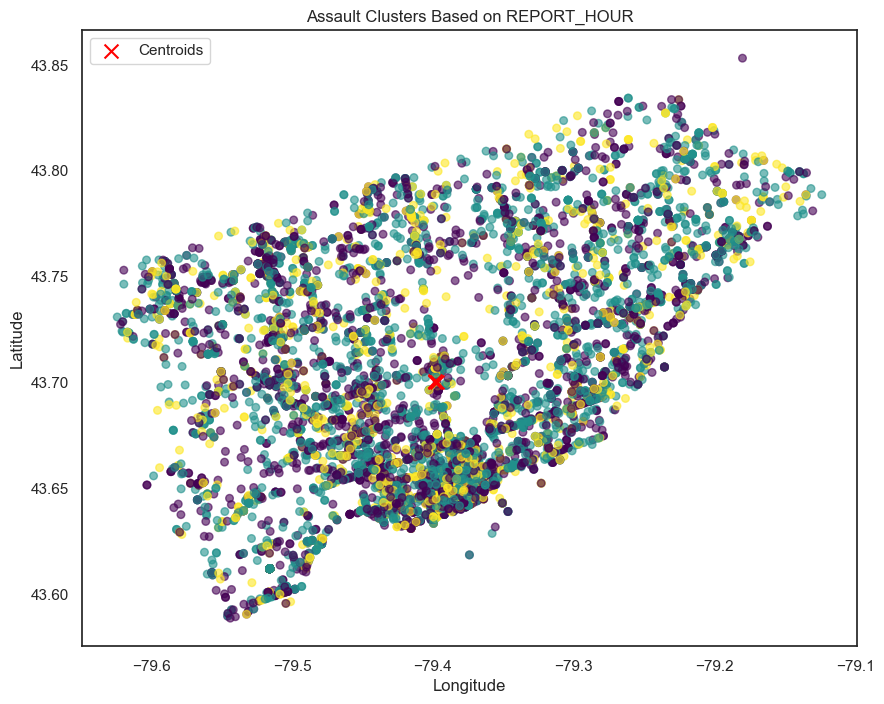

Map for Assault saved as 'assault_clusters_by_hour_map.html'.


In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import folium

# Step 1: Load Data Automatically
file_path = r"C:\\Users\User\\Downloads\\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv"  # Path to the uploaded file
data = pd.read_csv(file_path)

# Step 2: Filter Valid Data and Target Offences
data = data[(data['LAT_WGS84'] != 0) & (data['LONG_WGS84'] != 0)]  # Remove invalid (0,0) points
data = data[data['OFFENCE'].isin(['Assault', 'Robbery'])]  # Keep only Assault and Robbery

# Step 3: Group Coordinates by Offence
offence_groups = data.groupby('OFFENCE')[['LAT_WGS84', 'LONG_WGS84', 'REPORT_HOUR']]

# Function to perform K-Means clustering
def perform_kmeans(coords, n_clusters=3):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(coords)
    return kmeans

# Function to plot clusters
def plot_clusters(coords, kmeans, title):
    plt.figure(figsize=(10, 8))  # Adjust figure size
    plt.scatter(coords[:, 1], coords[:, 0], c=kmeans.labels_, cmap='viridis', s=30, alpha=0.6)
    plt.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 0], c='red', marker='x', s=100, label='Centroids')
    plt.title(title)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.show()

# Function to create Folium map
def create_folium_map(coords, kmeans, title):
    map_center = [np.mean(coords[:, 0]), np.mean(coords[:, 1])]
    crime_map = folium.Map(location=map_center, zoom_start=12)
    
    for i, coord in enumerate(coords):
        cluster_label = kmeans.labels_[i]
        folium.CircleMarker(
            location=coord[:2], 
            radius=5,
            color=['blue', 'green', 'orange', 'purple'][cluster_label % 4],
            fill=True,
            fill_opacity=0.6
        ).add_to(crime_map)
    
    for centroid in kmeans.cluster_centers_:
        folium.Marker(
            location=centroid[:2], 
            icon=folium.Icon(color='red', icon='info-sign'),
            popup="Cluster Centroid"
        ).add_to(crime_map)
    
    return crime_map

# Step 4: K-Means for Assault and Robbery Based on REPORT_HOUR
for offence, group in offence_groups:
    print(f"\nProcessing Offence: {offence}")
    # Use Latitude, Longitude, and Report Hour for clustering
    coords = group[['LAT_WGS84', 'LONG_WGS84', 'REPORT_HOUR']].values
    kmeans = perform_kmeans(coords, n_clusters=3)
    
    # Plot Clusters (only using Lat and Long for visualization)
    plot_clusters(coords, kmeans, f"{offence} Clusters Based on REPORT_HOUR")
    
    # Create and Save Folium Map
    crime_map = create_folium_map(coords, kmeans, f"{offence} Clusters Based on REPORT_HOUR")
    map_file = f"{offence}_clusters_by_hour_map.html".lower().replace(" ", "_")
    crime_map.save(map_file)
    print(f"Map for {offence} saved as '{map_file}'.")


In [83]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.cluster import KMeans
import folium

# Step 1: Load Data Automatically
file_path = r"C:\\Users\\User\\Downloads\\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv"  # Path to the uploaded file
data = pd.read_csv(file_path)

# Step 2: Filter Valid Data and Target Offences
data = data[(data['LAT_WGS84'] != 0) & (data['LONG_WGS84'] != 0)]  # Remove invalid (0,0) points
data = data[data['OFFENCE'].isin(['Assault', 'Robbery'])]  # Keep only Assault and Robbery

# Step 3: Group Coordinates by Offence
offence_groups = data.groupby('OFFENCE')[['LAT_WGS84', 'LONG_WGS84', 'REPORT_HOUR']]

# Function to perform K-Means clustering
def perform_kmeans(coords, n_clusters=4):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(coords)
    return kmeans

# Function to create Folium map
def create_folium_map(coords, kmeans, title):
    map_center = [np.mean(coords[:, 0]), np.mean(coords[:, 1])]
    crime_map = folium.Map(location=map_center, zoom_start=12)
    
    for i, coord in enumerate(coords):
        cluster_label = kmeans.labels_[i]
        folium.CircleMarker(
            location=coord[:2], 
            radius=5,
            color=['blue', 'green', 'orange', 'purple'][cluster_label % 4],
            fill=True,
            fill_opacity=0.6
        ).add_to(crime_map)
    
    for centroid in kmeans.cluster_centers_:
        folium.Marker(
            location=centroid[:2], 
            icon=folium.Icon(color='red', icon='info-sign'),
            popup="Cluster Centroid"
        ).add_to(crime_map)
    
    return crime_map

# Function to bin REPORT_HOUR into 4 classes
def bin_hours_to_4_classes(hour):
    if 6 <= hour < 12:
        return 0  # Morning
    elif 12 <= hour < 18:
        return 1  # Afternoon
    elif 18 <= hour < 24:
        return 2  # Evening
    else:
        return 3  # Night

# Step 4: Process Data by Offence and Bin REPORT_HOUR into 4 categories
for offence, group in offence_groups:
    print(f"\nProcessing Offence: {offence}")
    
    # Bin the hours into 4 categories
    group['TIME_CLASS'] = group['REPORT_HOUR'].apply(bin_hours_to_4_classes)
    
    # Use Latitude, Longitude, and Time Class for clustering
    coords = group[['LAT_WGS84', 'LONG_WGS84', 'TIME_CLASS']].values
    kmeans = perform_kmeans(coords, n_clusters=4)
    
    # Add cluster labels and time classes for visualization
    group['CLUSTER'] = kmeans.labels_
    group['Cluster_Label'] = group['CLUSTER'].map({0: 'Morning', 1: 'Afternoon', 2: 'Evening', 3: 'Night'})

    # Create an interactive plot using Plotly
    fig = px.scatter(
        group,
        x='LONG_WGS84', 
        y='LAT_WGS84', 
        color='Cluster_Label', 
        color_discrete_map={'Morning': 'blue', 'Afternoon': 'green', 'Evening': 'orange', 'Night': 'purple'},
        title=f"{offence} Clusters Based on Time Classes",
        labels={"LONG_WGS84": "Longitude", "LAT_WGS84": "Latitude", "Cluster_Label": "Time of Day"}
    )
    
    # Show plot with legend and labels
    fig.update_layout(
        showlegend=True,
        legend_title="Time of Day",
        legend=dict(
            x=0.85, y=0.5, traceorder='normal',
            title='Cluster Time of Day', orientation='h'
        )
    )
    
    fig.show()
    
    # Create and Save Folium Map
    crime_map = create_folium_map(coords, kmeans, f"{offence} Clusters Based on Time Classes")
    map_file = f"{offence}_clusters_by_time_class_map.html".lower().replace(" ", "_")
    crime_map.save(map_file)
    print(f"Map for {offence} saved as '{map_file}'.")



Processing Offence: Assault


C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\User\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


Map for Assault saved as 'assault_clusters_by_time_class_map.html'.


In [ ]:
# Load CSV and ensure necessary columns
data = pd.read_csv(file_path)
required_columns = {'LONG_WGS84', 'LAT_WGS84', 'MCI_CATEGORY'}
if not required_columns.issubset(data.columns):
    raise ValueError(f"Missing required columns: {required_columns - set(data.columns)}")

# Drop rows with (0, 0) coordinates
data = data[~((data['LAT_WGS84'] == 0) & (data['LONG_WGS84'] == 0))]

# Filter for 'Robbery'
robbery_data = data[data['MCI_CATEGORY'] == 'Robbery']


In [96]:
import pandas as pd
import geopandas as gpd
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata


shapefile_path = r"C:\Users\User\Downloads\Neighbourhood_Crime_Rates_Open_Data_-7850543563477888236\NEIGHBOURHOOD_CRIME_RATE_OPEN_DATA.shp"





# Convert to GeoDataFrame
robbery_gdf = gpd.GeoDataFrame(
    robbery_data,
    geometry=gpd.points_from_xy(robbery_data.LONG_WGS84, robbery_data.LAT_WGS84),
    crs="EPSG:4326"  # Latitude/Longitude CRS
)

# Step 2: Load Boundary Shapefile and Ensure CRS Alignment
boundary = gpd.read_file(shapefile_path)

# Ensure CRS matches
if boundary.crs != robbery_gdf.crs:
    boundary = boundary.to_crs(robbery_gdf.crs)

# Step 3: Create a Grid for Interpolation
x_min, x_max = robbery_gdf['LONG_WGS84'].min(), robbery_gdf['LONG_WGS84'].max()
y_min, y_max = robbery_gdf['LAT_WGS84'].min(), robbery_gdf['LAT_WGS84'].max()

# Define grid resolution (coarser to prevent overloading)
grid_res = 0.01
grid_x, grid_y = np.meshgrid(
    np.arange(x_min, x_max, grid_res),
    np.arange(y_min, y_max, grid_res)
)

# Step 4: Perform Nearest-Neighbor Interpolation
points = robbery_gdf[['LONG_WGS84', 'LAT_WGS84']].values
values = np.arange(len(points))  # Use a simple placeholder index for demonstration

# Interpolate using griddata
grid_z_nn = griddata(points, values, (grid_x, grid_y), method='nearest')

# Step 5: Visualization using Plotly (No Map, Just Heatmap)
fig = go.Figure()

# Add the interpolated surface
fig.add_trace(go.Heatmap(
    z=grid_z_nn,
    x=np.arange(x_min, x_max, grid_res),
    y=np.arange(y_min, y_max, grid_res),
    colorscale='Viridis',
    colorbar=dict(title="Interpolated Crime Index"),
    showscale=True
))

# Overlay the robbery points on the heatmap
fig.add_trace(go.Scatter(
    x=robbery_gdf['LONG_WGS84'],
    y=robbery_gdf['LAT_WGS84'],
    mode='markers',
    marker=dict(color='red', size=5, opacity=0.8),
    name='Robbery Locations'
))

# Layout settings (without geo)
fig.update_layout(
    title="Nearest-Neighbor Interpolation for Robberies",
    xaxis_title="Longitude",
    yaxis_title="Latitude",
    template="simple_white"  # Remove map background
)

fig.show()


OLS Regression Summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.650
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     40.80
Date:                Wed, 18 Dec 2024   Prob (F-statistic):           1.99e-06
Time:                        19:39:38   Log-Likelihood:                -144.09
No. Observations:                  24   AIC:                             292.2
Df Residuals:                      22   BIC:                             294.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        261.2200     40

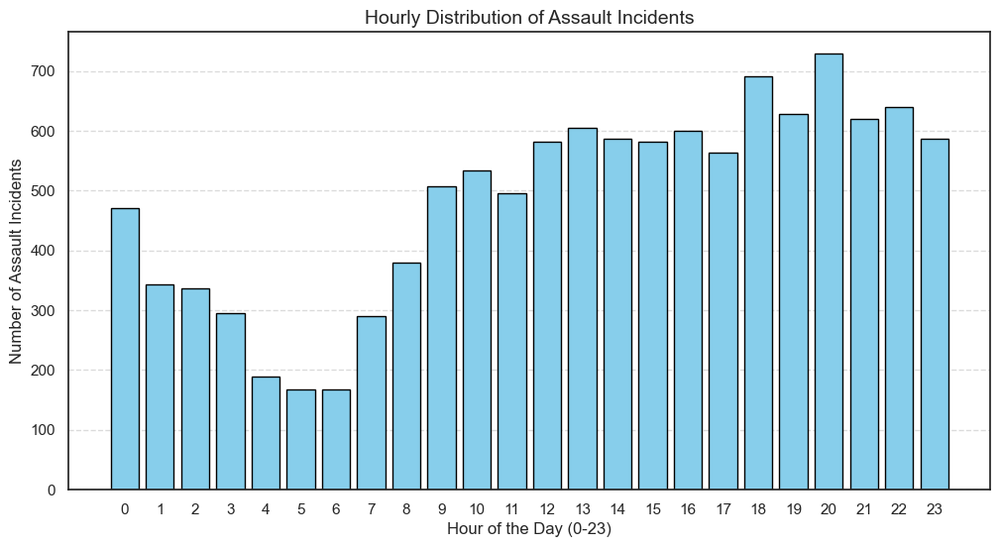

In [91]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
from sklearn.metrics.pairwise import haversine_distances
from statsmodels.api import OLS, add_constant

# Step 1: Load the CSV Data
file_path = r"C:\\Users\\User\\Downloads\\Major_Crime_Indicators_Open_Data_7078712861615598701 (1).csv"

# Load CSV and check required columns
data = pd.read_csv(file_path)
required_columns = {'LAT_WGS84', 'LONG_WGS84', 'MCI_CATEGORY', 'REPORT_HOUR'}
if not required_columns.issubset(data.columns):
    raise ValueError(f"Missing required columns: {required_columns - set(data.columns)}")

# Convert to GeoDataFrame
data = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data.LONG_WGS84, data.LAT_WGS84),
    crs="EPSG:4326",
)

# Step 2: Filter Data for 'Assault' Category
assault_data = data[data['MCI_CATEGORY'] == 'Assault'].copy()

# Check if there is enough data
if len(assault_data) < 5:
    raise ValueError("Not enough 'Assault' data points for analysis.")

# Step 3: Group Assault Data by REPORT_HOUR
hourly_assaults = assault_data.groupby('REPORT_HOUR').size().reset_index(name='Incident_Count')

# Step 4: Regression Analysis - Does REPORT_HOUR Predict Incident Density?
X = add_constant(hourly_assaults['REPORT_HOUR'].values.reshape(-1, 1))  # Independent variable
y = hourly_assaults['Incident_Count'].values  # Dependent variable

# OLS Regression
ols_model = OLS(y, X).fit()

print("OLS Regression Summary:")
print(ols_model.summary())

# Step 5: Visualization - Assaults by Hour of the Day
plt.figure(figsize=(12, 6))
plt.bar(hourly_assaults['REPORT_HOUR'], hourly_assaults['Incident_Count'], color='skyblue', edgecolor='black')
plt.xlabel('Hour of the Day (0-23)', fontsize=12)
plt.ylabel('Number of Assault Incidents', fontsize=12)
plt.title('Hourly Distribution of Assault Incidents', fontsize=14)
plt.xticks(range(0, 24))  # Ensure all hours are displayed
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

